<a href="https://colab.research.google.com/github/felipehigon/IA3_AP1_2_Encryption_GAN/blob/main/Encryption_Chat_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# LOAD LIBRARIES

In [1]:
import numpy as np
import pandas as pd
from numpy import expand_dims
from numpy import zeros
from numpy import ones
from numpy.random import randn
from numpy.random import randint
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Input, Lambda, Conv2D, Conv1D, MaxPooling2D,MaxPooling1D, Flatten, Dropout, Reshape, Conv2DTranspose,LeakyReLU, Embedding, Concatenate, GlobalMaxPooling2D, BatchNormalization
import matplotlib.pyplot as plt
from tqdm import tqdm
from time import time
import seaborn as sns
import random
from google.colab import drive

In [2]:
# Train is True for train all models
# Train is False for download pre-trained models
Train = False # @param {type:"boolean"}

In [ ]:
#drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
# DOWNLOAD LINKS:
#https://drive.google.com/file/d/13SPyIFMktfAetfvDen0LYOqiL8swB6v0/view?usp=sharing
#https://drive.google.com/file/d/1D7boQHL-76-ssYAxs6i_PlYgcio2w06s/view?usp=sharing
#https://drive.google.com/file/d/1FEBvn3BEYaiJWClb8HJyzuVNuJU8rHBO/view?usp=sharing
#https://drive.google.com/file/d/1ZKJTVIaMTvtCRYufwK-jX5WPZRxPWDf8/view?usp=sharing
#https://drive.google.com/file/d/1YIES6JUGGgib1o-deTp-qFYy4TRAIER2/view?usp=sharing
#https://drive.google.com/file/d/1U8kCrZ6n2LBEtc4y_p_PCqg3NX8CxJpY/view?usp=sharing
#https://drive.google.com/file/d/1LkeNb-o2jK1OfDgRfxxRVvg6gYic3wSH/view?usp=sharing
#https://drive.google.com/file/d/1rRyHXnmqoDeCL-W5HjAa4CuS743NhTDE/view?usp=sharing
#https://drive.google.com/file/d/1oK2SfZRMfxjxzNL_ReFHne064k6uLkcI/view?usp=sharing
#https://drive.google.com/file/d/18F4ujfYbgBqVtt8Mv74u-m3O0niQOsqy/view?usp=sharing

!wget -O decoder1.h5 https://drive.google.com/uc?id=13SPyIFMktfAetfvDen0LYOqiL8swB6v0&export=download&authuser=0
!wget -O decoder2.h5 https://drive.google.com/uc?id=1FEBvn3BEYaiJWClb8HJyzuVNuJU8rHBO&export=download&authuser=0
!wget -O encoder1.h5 https://drive.google.com/uc?id=1ZKJTVIaMTvtCRYufwK-jX5WPZRxPWDf8&export=download&authuser=0
!wget -O encoder2.h5 https://drive.google.com/uc?id=1YIES6JUGGgib1o-deTp-qFYy4TRAIER2&export=download&authuser=0
!wget -O cgan_generator.h5 https://drive.google.com/uc?id=1D7boQHL-76-ssYAxs6i_PlYgcio2w06s&export=download&authuser=0
!wget -O modelG_N.h5 https://drive.google.com/uc?id=1U8kCrZ6n2LBEtc4y_p_PCqg3NX8CxJpY&export=download&authuser=0
!wget -O model_Hack.h5 https://drive.google.com/uc?id=1LkeNb-o2jK1OfDgRfxxRVvg6gYic3wSH&export=download&authuser=0
!wget -O X_dataframe.xlsx https://drive.google.com/uc?id=1rRyHXnmqoDeCL-W5HjAa4CuS743NhTDE&export=download&authuser=0
!wget -O y_dataframe.xlsx https://drive.google.com/uc?id=1oK2SfZRMfxjxzNL_ReFHne064k6uLkcI&export=download&authuser=0
!wget -O dataframe.xlsx https://drive.google.com/uc?id=18F4ujfYbgBqVtt8Mv74u-m3O0niQOsqy&export=download&authuser=0

--2021-03-07 15:42:10--  https://drive.google.com/uc?id=13SPyIFMktfAetfvDen0LYOqiL8swB6v0
Resolving drive.google.com (drive.google.com)... 74.125.142.138, 74.125.142.100, 74.125.142.113, ...
Connecting to drive.google.com (drive.google.com)|74.125.142.138|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-00-94-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/11an1qa9jgfkhv8pkn4l7sud7nikk3t2/1615131675000/06547371486526611445/*/13SPyIFMktfAetfvDen0LYOqiL8swB6v0 [following]
--2021-03-07 15:42:10--  https://doc-00-94-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/11an1qa9jgfkhv8pkn4l7sud7nikk3t2/1615131675000/06547371486526611445/*/13SPyIFMktfAetfvDen0LYOqiL8swB6v0
Resolving doc-00-94-docs.googleusercontent.com (doc-00-94-docs.googleusercontent.com)... 74.125.195.132, 2607:f8b0:400e:c09::84
Connecting to doc-00-94-docs.googleusercontent.com (doc-00-94-docs.googleusercontent.com)|74.125

In [4]:
tf.test.gpu_device_name()
import timeit

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print(
      '\n\nThis error most likely means that this notebook is not '
      'configured to use a GPU.  Change this in Notebook Settings via the '
      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  raise SystemError('GPU device not found')

def cpu():
  with tf.device('/cpu:0'):
    random_image_cpu = tf.random.normal((100, 100, 100, 3))
    net_cpu = tf.keras.layers.Conv2D(32, 7)(random_image_cpu)
    return tf.math.reduce_sum(net_cpu)

def gpu():
  with tf.device('/device:GPU:0'):
    random_image_gpu = tf.random.normal((100, 100, 100, 3))
    net_gpu = tf.keras.layers.Conv2D(32, 7)(random_image_gpu)
    return tf.math.reduce_sum(net_gpu)
  
# We run each op once to warm up; see: https://stackoverflow.com/a/45067900
cpu()
gpu()

# Run the op several times.
print('Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images '
      '(batch x height x width x channel). Sum of ten runs.')
print('CPU (s):')
cpu_time = timeit.timeit('cpu()', number=10, setup="from __main__ import cpu")
print(cpu_time)
print('GPU (s):')
gpu_time = timeit.timeit('gpu()', number=10, setup="from __main__ import gpu")
print(gpu_time)
print('GPU speedup over CPU: {}x'.format(int(cpu_time/gpu_time)))

Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images (batch x height x width x channel). Sum of ten runs.
CPU (s):
3.372865183999977
GPU (s):
0.048006845000003295
GPU speedup over CPU: 70x


# LOAD MNIST

In [5]:
# Load
num_classes = 10
(X_train, y_train), (X_test, y_test) = tf.keras.datasets.mnist.load_data()


# Normalization
X_train = X_train.astype('float32') / 255
X_test = X_test.astype('float32') / 255

X_train2D = np.expand_dims(X_train, -1)
X_test2D = np.expand_dims(X_test, -1)

y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

print(' -Entradas Entrenamiento:', X_train2D.shape)
print(' -Entradas Test:', X_test2D.shape)

print('Cambio de dimensiones para ajustar a la entrada de un Perceptrón:')
x_shape = X_train.shape
X_train = X_train.reshape(x_shape[0], x_shape[1]*x_shape[2])
X_test = X_test.reshape(len(X_test), x_shape[1]*x_shape[2])
print(' -Entradas Entrenamiento:', X_train.shape)
print(' -Entradas Test:', X_test.shape)

11493376/11490434 [==============================] - 0s 0us/step
 -Entradas Entrenamiento: (60000, 28, 28, 1)
 -Entradas Test: (10000, 28, 28, 1)
Cambio de dimensiones para ajustar a la entrada de un Perceptrón:
 -Entradas Entrenamiento: (60000, 784)
 -Entradas Test: (10000, 784)


# AUTOENCODER MODEL FOR GENERATING ENCRYPTION

*****************************************************************
			Autoencoder
*****************************************************************


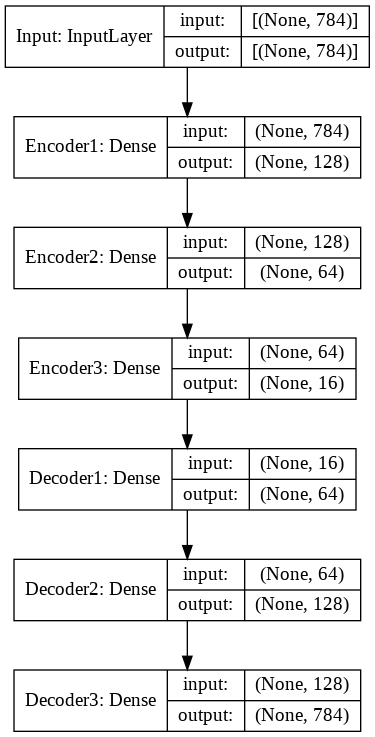

In [6]:
# Size of our encoded representation
# 32 Compression factor = 24.5 (the input is size 784)
# 16 Compression factor = 49 (the input is size 784)

def AutoEncript(encoding_dim = 32):  

# We define the layers for the input, the encoder and the decoder:
# Input
  input_img = Input(shape=(784,), name='Input')
  init = 'RandomNormal'

# encoder
  encoder1 = Dense(128, kernel_initializer=init, activation='relu', name='Encoder1')
  encoder2 = Dense(64, kernel_initializer=init,activation='relu', name='Encoder2')
  encoder3 = Dense(encoding_dim,kernel_initializer=init, activation='relu', name='Encoder3')

# decoder
  
  decoder1 = Dense(64,kernel_initializer=init, activation='relu', name='Decoder1')
  decoder2 = Dense(128,kernel_initializer=init, activation='relu', name='Decoder2')
  decoder3 = Dense(784,kernel_initializer=init, activation='sigmoid', name='Decoder3')

#       Autoencoder
# --------------------------

  encoded = encoder1(input_img)
  encoded = encoder2(encoded)
  encoded = encoder3(encoded)

  decoded = decoder1(encoded)
  decoded = decoder2(decoded)
  decoded = decoder3(decoded)

# Model that rebuilds an input
  autoencoder = tf.keras.Model(input_img, decoded, name='AUTOENCODER')

# I create encoder separately
  encoder = tf.keras.Model(input_img, encoded, name='ENCODER')
# I create decoder separately
  input_img_e = Input(shape=(encoding_dim,), name='Input_e')
  decoded2 = decoder1(input_img_e)
  decoded2 = decoder2(decoded2)
  decoded2 = decoder3(decoded2)
  decoder = tf.keras.Model(input_img_e, decoded2, name='DECODER')

  return autoencoder, encoder, decoder, input_img

autoencoder1, encoder1, decoder1, input_img1 = AutoEncript(16)
autoencoder2, encoder2, decoder2, input_img2 = AutoEncript(16)
# Visualize architecture and dimensions
print(f"{'*'*65}\n\t\t\tAutoencoder\n{'*'*65}")
dot_img_file = '/tmp/autoencoder_1.png'
tf.keras.utils.plot_model(autoencoder1,to_file=dot_img_file, show_shapes=True)

In [40]:
autoencoder1.summary()

Model: "AUTOENCODER"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Input (InputLayer)           [(None, 784)]             0         
_________________________________________________________________
Encoder1 (Dense)             (None, 128)               100480    
_________________________________________________________________
Encoder2 (Dense)             (None, 64)                8256      
_________________________________________________________________
Encoder3 (Dense)             (None, 16)                1040      
_________________________________________________________________
Decoder1 (Dense)             (None, 64)                1088      
_________________________________________________________________
Decoder2 (Dense)             (None, 128)               8320      
_________________________________________________________________
Decoder3 (Dense)             (None, 784)               

In [ ]:
# Train models
if Train:
  with tf.device(device_name):
    autoencoder1.compile(optimizer='adam', loss='binary_crossentropy')
    history= autoencoder1.fit(X_train, X_train,
                      epochs=50,
                      batch_size=256,
                      shuffle=True,
                      validation_data=(X_test, X_test))
    autoencoder2.compile(optimizer='adam', loss='binary_crossentropy')
    history= autoencoder2.fit(X_train, X_train,
                      epochs=50,
                      batch_size=256,
                      shuffle=True,
                      validation_data=(X_test, X_test))


Epoch 1/50
235/235 [==============================] - 2s 6ms/step - loss: 0.3478 - val_loss: 0.1701
Epoch 2/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1619 - val_loss: 0.1406
Epoch 3/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1385 - val_loss: 0.1275
Epoch 4/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1261 - val_loss: 0.1189
Epoch 5/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1191 - val_loss: 0.1143
Epoch 6/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1154 - val_loss: 0.1118
Epoch 7/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1128 - val_loss: 0.1099
Epoch 8/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1111 - val_loss: 0.1085
Epoch 9/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1097 - val_loss: 0.1074
Epoch 10/50
235/235 [==============================] - 1s 4ms/step - loss: 0.1082 - val_loss: 0.1064

- If we don´t want to train, pre-trained models are loaded

In [7]:
if not Train:
  decoder1.load_weights("/content/decoder1.h5")
  decoder2.load_weights("/content/decoder2.h5")
  encoder1.load_weights("/content/encoder1.h5")
  encoder2.load_weights("/content/encoder2.h5")

# LATENT SPACE CHECK

- Encoders and decoders are combined to see that latent spaces are not common for different models

In [8]:
# We encode and decode some example digits (test data)
# -----------------------
encoded1_imgs = encoder1.predict(X_test)
encoded2_imgs = encoder2.predict(X_test)

decoded1_imgs = decoder1.predict(encoded1_imgs)
decoded2_imgs = decoder2.predict(encoded2_imgs)

decoded1_2_imgs = decoder1.predict(encoded2_imgs)
decoded2_1_imgs = decoder2.predict(encoded1_imgs)
 
def subplot(X,i,encoded_imgs, decoded_imgs, n_images,encoding_dim):
  # Input (original)
    plt.subplot(3, n_images, i + 1)
    plt.imshow(X[i].reshape(28, 28), cmap='gray')
    plt.title('Entrada')
    plt.axis('off')

    # Codification
    plt.subplot(3, n_images, i + 1 + n_images)
    plt.imshow(encoded_imgs[i].reshape(1, encoding_dim), cmap='gray')
    #print(encoded_imgs[i].reshape(1, encoding_dim))
    plt.axis('off')
    plt.title('Entrada codificada')
    
    # Reconstruction
    if n_images == 1:
      plt.subplot(3, n_images, i + n_images + n_images)
    else:
      plt.subplot(3, n_images, i + 1 + n_images + n_images)
    plt.imshow(decoded_imgs[i].reshape(28, 28), cmap='gray')
    plt.axis('off')
    plt.title('Reconstrucción')

def plot_data(X,encoded_imgs, decoded_imgs, n_images = 10,encoding_dim = 32):
  plt.figure(figsize=(30, 4))
  if n_images >= 2:
    for i in range(n_images):
      subplot(X,i,encoded_imgs, decoded_imgs, n_images,encoding_dim)
  elif n_images == 1:
    subplot(X,1,encoded_imgs, decoded_imgs, n_images,encoding_dim)



- ENCODER 1 DECODER 1

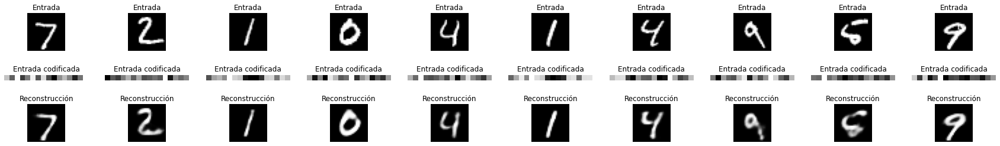

In [ ]:
plot_data(X_test,encoded1_imgs,decoded1_imgs,encoding_dim=16)

- ENCODER 2 DECODER 2

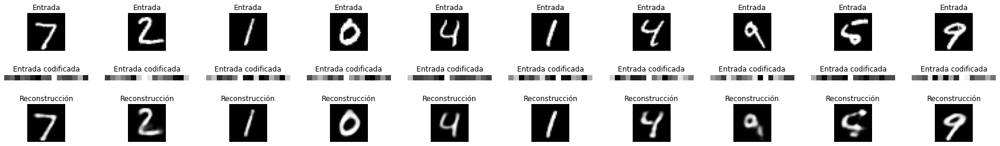

In [ ]:
plot_data(X_test,encoded2_imgs,decoded2_imgs,encoding_dim=16)

- It can be seen that when combining different encoders and decoders by having a random weight initialization, the latent spaces do not coincide and allow generating an encryption of the data

- ENCODER 1 DECODER 2

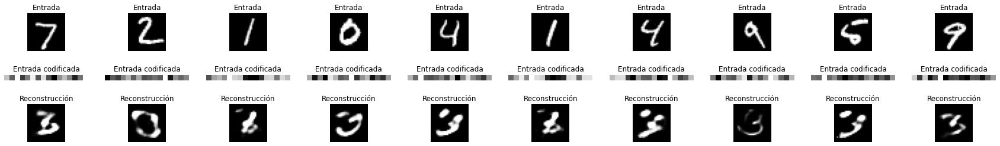

In [ ]:
plot_data(X_test,encoded1_imgs,decoded1_2_imgs,encoding_dim=16)

- ENCODER 2 DECODER 1

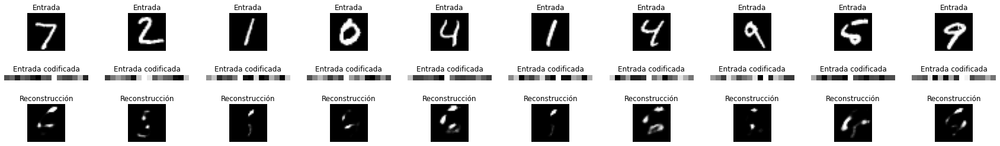

In [ ]:
plot_data(X_test,encoded2_imgs,decoded2_1_imgs,encoding_dim=16)

# CONDITIONAL GAN MODEL TO GENERATE NUMBER IMAGE

In [9]:
#https://machinelearningmastery.com/how-to-develop-a-conditional-generative-adversarial-network-from-scratch/
from keras.datasets.mnist import load_data
from keras.optimizers import Adam
from keras.models import Model
 
# define the standalone discriminator model
def define_discriminator(in_shape=(28,28,1), n_classes=10):
	# label input
	in_label = Input(shape=(1,),name='Etiqueta1')
	# embedding for categorical input
	li = Embedding(n_classes, 50,name='Etiqueta2')(in_label)
	# scale up to image dimensions with linear activation
	n_nodes = in_shape[0] * in_shape[1]
	li = Dense(n_nodes,name='Etiqueta3')(li)
	# reshape to additional channel
	li = Reshape((in_shape[0], in_shape[1], 1),name='Etiqueta4')(li)
	# image input
	in_image = Input(shape=in_shape,name='Imagen')
	# concat label as a channel
	merge = Concatenate()([in_image, li])
	# downsample
	fe = Conv2D(128, (3,3), strides=(2,2), padding='same')(merge)
	fe = LeakyReLU(alpha=0.2)(fe)
	# downsample
	fe = Conv2D(128, (3,3), strides=(2,2), padding='same')(fe)
	fe = LeakyReLU(alpha=0.2)(fe)
	# flatten feature maps
	fe = Flatten()(fe)
	# dropout
	fe = Dropout(0.4)(fe)
	# output
	out_layer = Dense(1, activation='sigmoid')(fe)
	# define model
	model = Model([in_image, in_label], out_layer, name='GAN_DISCRIMINADOR')
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
	return model
 
# define the standalone generator model
def define_generator(latent_dim, n_classes=10):
	# label input
	in_label = Input(shape=(1,))
	# embedding for categorical input
	li = Embedding(n_classes, 50)(in_label)
	# linear multiplication
	n_nodes = 7 * 7
	li = Dense(n_nodes)(li)
	# reshape to additional channel
	li = Reshape((7, 7, 1))(li)
	# image generator input
	in_lat = Input(shape=(latent_dim,))
	# foundation for 7x7 image
	n_nodes = 128 * 7 * 7
	gen = Dense(n_nodes)(in_lat)
	gen = LeakyReLU(alpha=0.2)(gen)
	gen = Reshape((7, 7, 128))(gen)
	# merge image gen and label input
	merge = Concatenate()([gen, li])
	# upsample to 14x14
	gen = Conv2DTranspose(128, (4,4), strides=(2,2), padding='same')(merge)
	gen = LeakyReLU(alpha=0.2)(gen)
	# upsample to 28x28
	gen = Conv2DTranspose(128, (4,4), strides=(2,2), padding='same')(gen)
	gen = LeakyReLU(alpha=0.2)(gen)
	# output
	out_layer = Conv2D(1, (7,7), activation='tanh', padding='same')(gen)
	# define model
	model = Model([in_lat, in_label], out_layer, name='GAN_GENERADOR')
	return model
 
# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):
	# make weights in the discriminator not trainable
	d_model.trainable = False
	# get noise and label inputs from generator model
	gen_noise, gen_label = g_model.input
	# get image output from the generator model
	gen_output = g_model.output
	# connect image output and label input from generator as inputs to discriminator
	gan_output = d_model([gen_output, gen_label])
	# define gan model as taking noise and label and outputting a classification
	model = Model([gen_noise, gen_label], gan_output)
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt)
	return model
 
# load mnist images
def load_real_samples():
	# load dataset
  (trainX, trainy), (_, _) = load_data()
	# expand to 3d, e.g. add channels
  X = expand_dims(trainX, axis=-1)
	# convert from ints to floats
  X = X.astype('float32')
	# scale
  X = X / 255
  return [X, trainy]
 
# # select real samples
def generate_real_samples(dataset, n_samples):
	# split into images and labels
	images, labels = dataset
	# choose random instances
	ix = randint(0, images.shape[0], n_samples)
	# select images and labels
	X, labels = images[ix], labels[ix]
	# generate class labels
	y = ones((n_samples, 1))
	return [X, labels], y
 
# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples, n_classes=10):
	# generate points in the latent space
	x_input = randn(latent_dim * n_samples)
	# reshape into a batch of inputs for the network
	z_input = x_input.reshape(n_samples, latent_dim)
	# generate labels
	labels = randint(0, n_classes, n_samples)
	return [z_input, labels]
 
# use the generator to generate n fake examples, with class labels
def generate_fake_samples(generator, latent_dim, n_samples):
	# generate points in latent space
	z_input, labels_input = generate_latent_points(latent_dim, n_samples)
	# predict outputs
	images = generator.predict([z_input, labels_input])
	# create class labels, zero is fake
	y = zeros((n_samples, 1))
	return [images, labels_input], y
 
# train the generator and discriminator
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=50, n_batch=256):
  bat_per_epo = int(dataset[0].shape[0] / n_batch)
  half_batch = int(n_batch / 2)
	# manually enumerate epochs
  loss_best = 1000
  for i in tqdm(range(n_epochs)):
		# enumerate batches over the training set
    for j in range(bat_per_epo):
			# get randomly selected 'real' samples
      [X_real, labels_real], y_real = generate_real_samples(dataset, half_batch)
			# update discriminator model weights
      d_loss1, _ = d_model.train_on_batch([X_real, labels_real], y_real)
			# generate 'fake' examples
      [X_fake, labels], y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
			# update discriminator model weights
      d_loss2, _ = d_model.train_on_batch([X_fake, labels], y_fake)
			# prepare points in latent space as input for the generator
      [z_input, labels_input] = generate_latent_points(latent_dim, n_batch)
			# create inverted labels for the fake samples, one is real
      y_gan = ones((n_batch, 1))
			# update the generator via the discriminator's error. weights discrimintators frozen.
      g_loss = gan_model.train_on_batch([z_input, labels_input], y_gan)
			# summarize loss on this batch
      loss = d_loss1 + d_loss2 + g_loss
      if loss < loss_best:
        # save the models and update loss_best
        loss_best = loss
        g_model.save('cgan_generator.h5')
        d_model.save('cgan_discriminator.h5')
        gan_model.save('cgan.h5')
      if j==1:
        print('>%d, %d/%d, d_real=%.3f, d_fake=%.3f g=%.3f' %(i+1, j+1, bat_per_epo, d_loss1, d_loss2, g_loss))
  print("Mejor loss: ",loss_best)

In [10]:
# If training is not going to be carried out, we define models and then load the weights
if not Train:
  latent_dim = 100
  d_model = define_discriminator()
  g_model = define_generator(latent_dim)
  gan_model = define_gan(g_model, d_model)

In [ ]:
# Train GAN MODEL
if Train:
  with tf.device(device_name):
    latent_dim = 100
# create the discriminator
    d_model = define_discriminator()
# create the generator
    g_model = define_generator(latent_dim)
# create the gan
    gan_model = define_gan(g_model, d_model)
# load image data
    dataset = load_real_samples()
# train model
    train(g_model, d_model, gan_model, dataset, latent_dim)

  0%|          | 0/50 [00:00<?, ?it/s]

>1, 2/234, d_real=0.670, d_fake=0.697 g=0.690


  2%|▏         | 1/50 [00:27<22:46, 27.89s/it]

>2, 2/234, d_real=0.592, d_fake=0.635 g=0.852


  4%|▍         | 2/50 [00:49<20:47, 25.99s/it]

>3, 2/234, d_real=0.562, d_fake=0.587 g=0.923


  6%|▌         | 3/50 [01:11<19:28, 24.87s/it]

>4, 2/234, d_real=0.555, d_fake=0.549 g=1.083


  8%|▊         | 4/50 [01:33<18:22, 23.98s/it]

>5, 2/234, d_real=0.572, d_fake=0.468 g=1.215


 10%|█         | 5/50 [01:55<17:28, 23.31s/it]

>6, 2/234, d_real=0.509, d_fake=0.555 g=1.113


 12%|█▏        | 6/50 [02:17<16:46, 22.87s/it]

>7, 2/234, d_real=0.488, d_fake=0.615 g=1.114


 14%|█▍        | 7/50 [02:39<16:09, 22.56s/it]

>8, 2/234, d_real=0.462, d_fake=0.461 g=1.327


 16%|█▌        | 8/50 [03:00<15:36, 22.30s/it]

>9, 2/234, d_real=0.434, d_fake=0.514 g=1.252


 18%|█▊        | 9/50 [03:22<15:09, 22.18s/it]

>10, 2/234, d_real=0.498, d_fake=0.431 g=1.486


 20%|██        | 10/50 [03:44<14:43, 22.08s/it]

>11, 2/234, d_real=0.435, d_fake=0.444 g=1.443


 22%|██▏       | 11/50 [04:06<14:19, 22.03s/it]

>12, 2/234, d_real=0.381, d_fake=0.520 g=1.503


 24%|██▍       | 12/50 [04:28<13:55, 21.99s/it]

>13, 2/234, d_real=0.385, d_fake=0.442 g=1.526


 26%|██▌       | 13/50 [04:50<13:32, 21.95s/it]

>14, 2/234, d_real=0.442, d_fake=0.371 g=1.672


 28%|██▊       | 14/50 [05:12<13:10, 21.96s/it]

>15, 2/234, d_real=0.497, d_fake=0.403 g=1.648


 30%|███       | 15/50 [05:34<12:48, 21.96s/it]

>16, 2/234, d_real=0.298, d_fake=0.406 g=1.852


 32%|███▏      | 16/50 [05:56<12:26, 21.97s/it]

>17, 2/234, d_real=0.411, d_fake=0.332 g=2.011


 34%|███▍      | 17/50 [06:18<12:06, 22.02s/it]

>18, 2/234, d_real=0.366, d_fake=0.354 g=1.865


 36%|███▌      | 18/50 [06:40<11:42, 21.96s/it]

>19, 2/234, d_real=0.470, d_fake=0.248 g=1.995


 38%|███▊      | 19/50 [07:01<11:19, 21.90s/it]

>20, 2/234, d_real=0.351, d_fake=0.448 g=2.085


 40%|████      | 20/50 [07:23<10:54, 21.83s/it]

>21, 2/234, d_real=0.422, d_fake=0.353 g=2.106


 42%|████▏     | 21/50 [07:45<10:32, 21.81s/it]

>22, 2/234, d_real=0.258, d_fake=0.390 g=2.075


 44%|████▍     | 22/50 [08:07<10:10, 21.82s/it]

>23, 2/234, d_real=0.552, d_fake=0.327 g=2.015


 46%|████▌     | 23/50 [08:28<09:48, 21.81s/it]

>24, 2/234, d_real=0.414, d_fake=0.204 g=2.711


 48%|████▊     | 24/50 [08:50<09:26, 21.77s/it]

>25, 2/234, d_real=0.432, d_fake=0.382 g=2.197


 50%|█████     | 25/50 [09:12<09:04, 21.77s/it]

>26, 2/234, d_real=0.477, d_fake=0.118 g=2.703


 52%|█████▏    | 26/50 [09:34<08:42, 21.77s/it]

>27, 2/234, d_real=0.307, d_fake=0.520 g=2.428


 54%|█████▍    | 27/50 [09:55<08:21, 21.79s/it]

>28, 2/234, d_real=0.228, d_fake=0.554 g=2.502


 56%|█████▌    | 28/50 [10:17<07:58, 21.74s/it]

>29, 2/234, d_real=0.581, d_fake=0.302 g=2.267


 58%|█████▊    | 29/50 [10:39<07:36, 21.74s/it]

>30, 2/234, d_real=0.351, d_fake=0.362 g=2.287


 60%|██████    | 30/50 [11:01<07:16, 21.80s/it]

>31, 2/234, d_real=0.298, d_fake=0.291 g=2.651


 62%|██████▏   | 31/50 [11:23<06:55, 21.86s/it]

>32, 2/234, d_real=0.512, d_fake=0.042 g=3.563


 64%|██████▍   | 32/50 [11:45<06:34, 21.94s/it]

>33, 2/234, d_real=0.373, d_fake=0.173 g=2.696


 66%|██████▌   | 33/50 [12:07<06:11, 21.87s/it]

>34, 2/234, d_real=0.184, d_fake=0.480 g=2.520


 68%|██████▊   | 34/50 [12:28<05:48, 21.81s/it]

>35, 2/234, d_real=0.330, d_fake=0.398 g=2.458


 70%|███████   | 35/50 [12:50<05:27, 21.81s/it]

>36, 2/234, d_real=0.325, d_fake=0.258 g=2.888


 72%|███████▏  | 36/50 [13:12<05:05, 21.80s/it]

>37, 2/234, d_real=0.215, d_fake=0.548 g=2.987


 74%|███████▍  | 37/50 [13:34<04:44, 21.87s/it]

>38, 2/234, d_real=0.355, d_fake=0.327 g=2.631


 76%|███████▌  | 38/50 [13:56<04:21, 21.82s/it]

>39, 2/234, d_real=0.377, d_fake=0.169 g=2.876


 78%|███████▊  | 39/50 [14:17<03:59, 21.79s/it]

>40, 2/234, d_real=0.130, d_fake=0.721 g=2.881


 80%|████████  | 40/50 [14:39<03:38, 21.83s/it]

>41, 2/234, d_real=0.609, d_fake=0.292 g=2.210


 82%|████████▏ | 41/50 [15:01<03:16, 21.82s/it]

>42, 2/234, d_real=0.376, d_fake=0.445 g=2.475


 84%|████████▍ | 42/50 [15:23<02:54, 21.85s/it]

>43, 2/234, d_real=0.238, d_fake=0.280 g=2.667


 86%|████████▌ | 43/50 [15:45<02:32, 21.84s/it]

>44, 2/234, d_real=0.598, d_fake=0.247 g=2.364


 88%|████████▊ | 44/50 [16:07<02:11, 21.84s/it]

>45, 2/234, d_real=0.228, d_fake=0.445 g=2.828


 90%|█████████ | 45/50 [16:29<01:49, 21.88s/it]

>46, 2/234, d_real=0.309, d_fake=0.186 g=2.909


 92%|█████████▏| 46/50 [16:51<01:27, 21.99s/it]

>47, 2/234, d_real=0.360, d_fake=0.526 g=2.892


 94%|█████████▍| 47/50 [17:13<01:05, 21.96s/it]

>48, 2/234, d_real=0.480, d_fake=0.060 g=3.024


 96%|█████████▌| 48/50 [17:34<00:43, 21.89s/it]

>49, 2/234, d_real=0.357, d_fake=0.149 g=3.076


 98%|█████████▊| 49/50 [17:56<00:21, 21.85s/it]

>50, 2/234, d_real=0.259, d_fake=0.157 g=3.028


100%|██████████| 50/50 [18:18<00:00, 21.97s/it]

Mejor loss:  1.6048633009195328


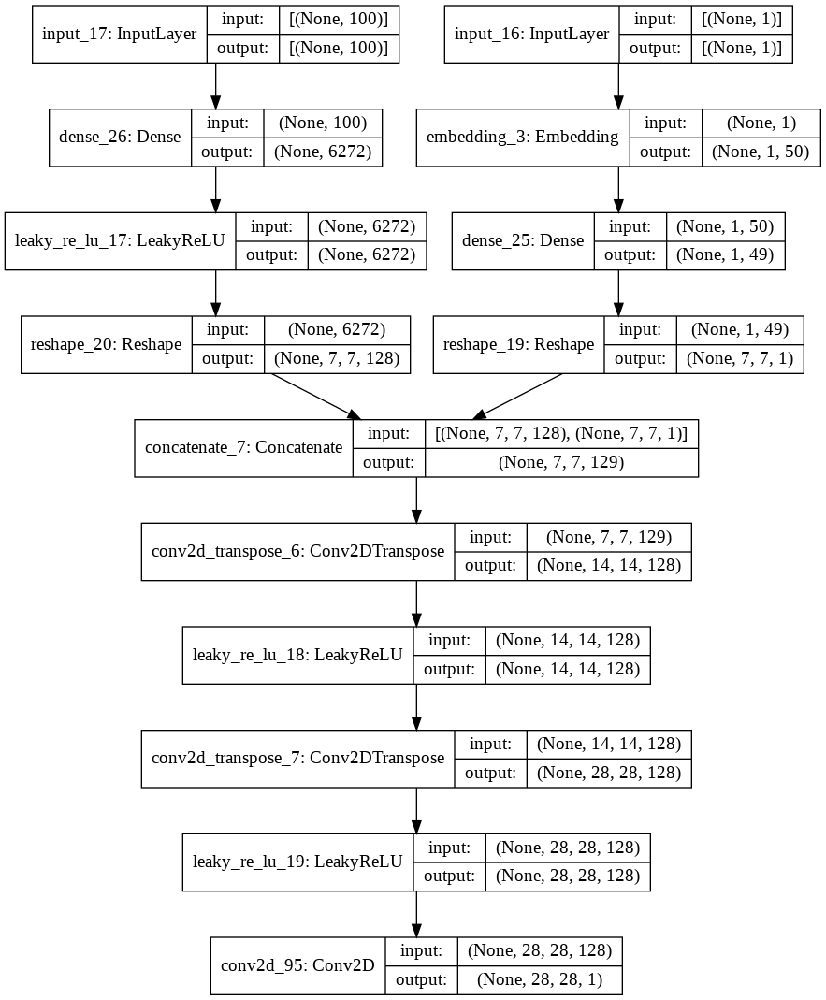

In [ ]:
# GENERATOR
dot_img_file = '/tmp/g_model.png'
tf.keras.utils.plot_model(g_model,to_file=dot_img_file, show_shapes=True)

In [41]:
g_model.summary()

Model: "GAN_GENERADOR"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
input_1 (InputLayer)            [(None, 1)]          0                                            
__________________________________________________________________________________________________
dense_2 (Dense)                 (None, 6272)         633472      input_2[0][0]                    
__________________________________________________________________________________________________
embedding (Embedding)           (None, 1, 50)        500         input_1[0][0]                    
______________________________________________________________________________________

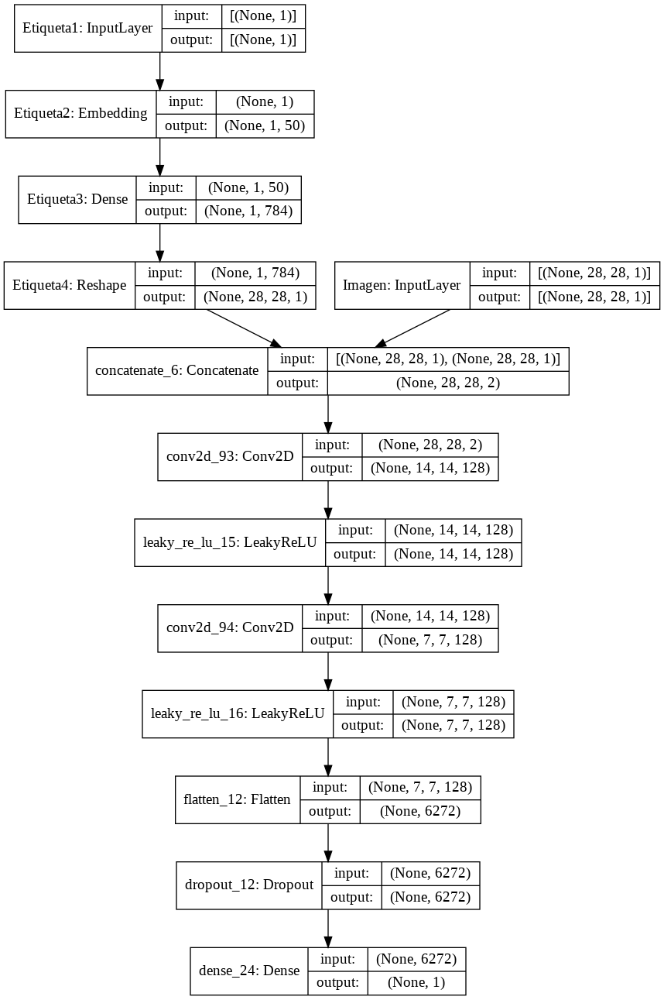

In [ ]:
#DISCRIMINATOR
dot_img_file = '/tmp/d_model.png'
tf.keras.utils.plot_model(d_model,to_file=dot_img_file, show_shapes=True)

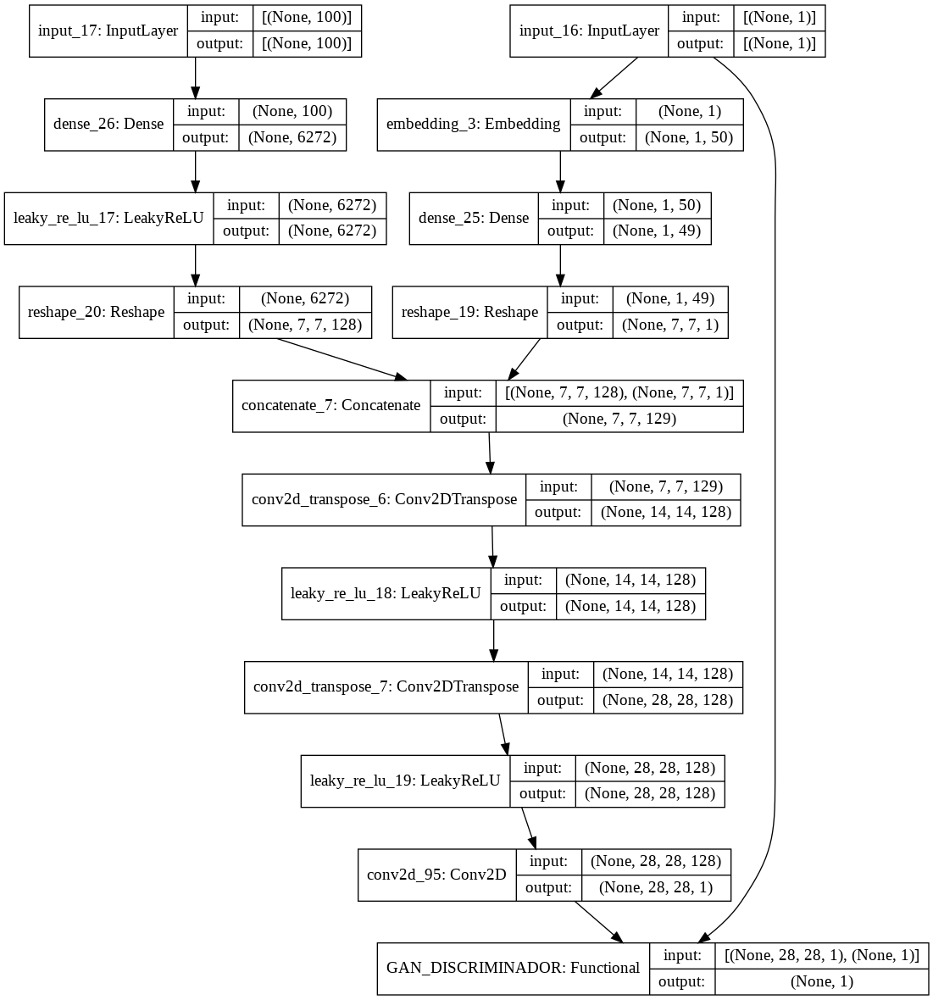

In [ ]:
# GAN MODEL
dot_img_file = '/tmp/gan_model.png'
tf.keras.utils.plot_model(gan_model,to_file=dot_img_file, show_shapes=True)

- Load generator and discriminator model since the idea is to use them separately

In [11]:
if not Train:
  g_model.load_weights("/content/cgan_generator.h5")

- I generate a function with the input to the GAN generator to be able to select number of samples and digit

In [12]:
def generate_numbers(latent_dim, n_samples, number, n_classes=10):
	# generate points in the latent space
	x_input = randn(latent_dim * n_samples)
	# reshape into a batch of inputs for the network
	z_input = x_input.reshape(n_samples, latent_dim)
	# generate labels
	labels = randint(number, number + 1, n_samples)
	return [z_input, labels]

- I generate 10 images of each number and they are passed through autoencoder 1

[0 0 0 0 0 0 0 0 0 0]
[1 1 1 1 1 1 1 1 1 1]
[2 2 2 2 2 2 2 2 2 2]
[3 3 3 3 3 3 3 3 3 3]
[4 4 4 4 4 4 4 4 4 4]
[5 5 5 5 5 5 5 5 5 5]
[6 6 6 6 6 6 6 6 6 6]
[7 7 7 7 7 7 7 7 7 7]
[8 8 8 8 8 8 8 8 8 8]
[9 9 9 9 9 9 9 9 9 9]


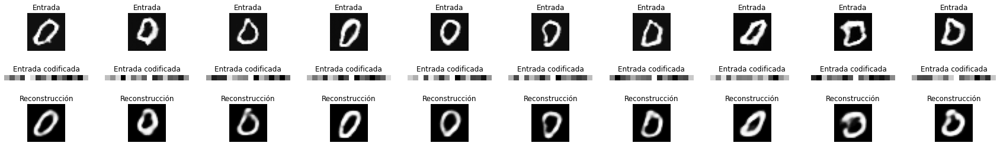

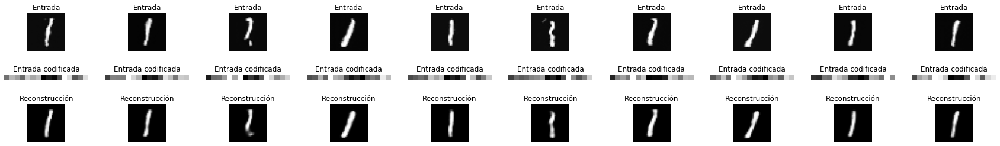

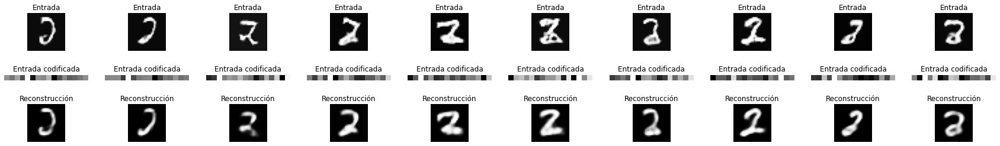

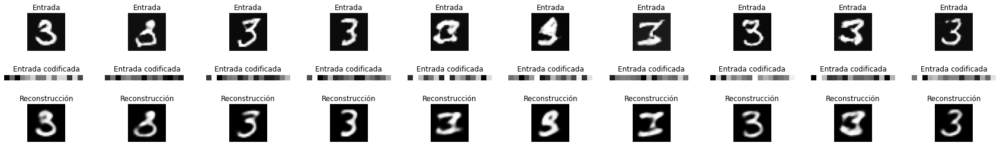

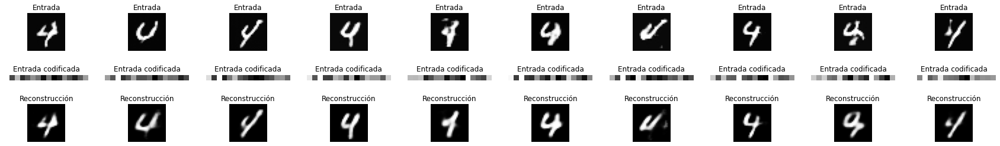

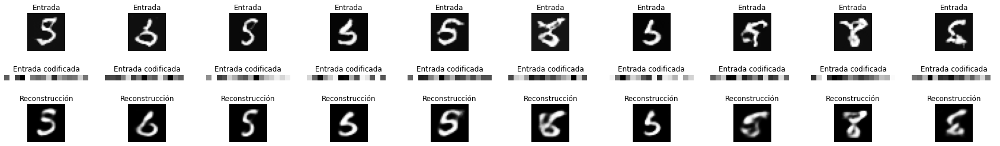

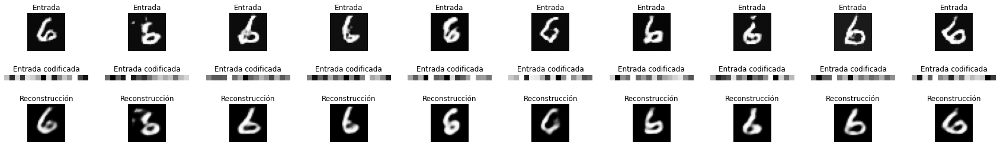

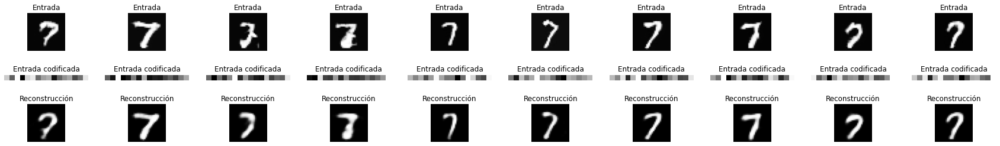

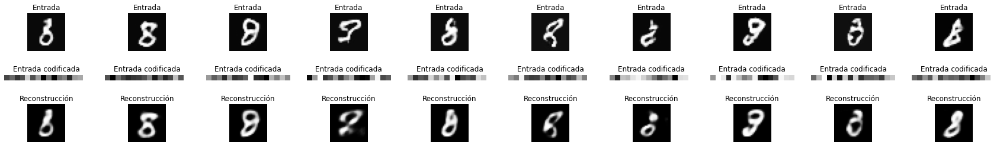

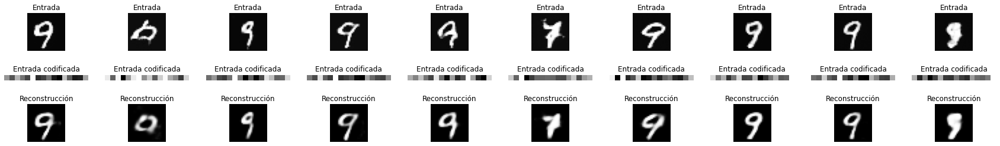

In [ ]:
latent_dim = 100
for num in range(10):
  z_input, labels_input = generate_numbers(latent_dim, 10, num)
  labels_input_c = keras.utils.to_categorical(labels_input, num_classes)
  print(labels_input)
  imgs=g_model.predict([z_input,labels_input])
  encoded1_imgs = encoder1.predict(imgs.reshape(-1,784))
  decoded1_imgs = decoder1.predict(encoded1_imgs)
  plot_data(imgs,encoded1_imgs,decoded1_imgs,encoding_dim=16)

# CONVOLUTIONAL MODEL TO GO FROM IMAGE TO NUMBER

In [13]:
def Conv_DE():
  input_shape = (28,28,1)
  num_classes = 10
  model = keras.Sequential(
    [
        Input(shape=input_shape),
        Conv2D(32, kernel_size=(3,3), activation="relu"),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(64, kernel_size=(3,3), activation="relu"),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dropout(0.5),
        Dense(num_classes, activation="softmax",name='SALIDA_DECO'),
    ],  name = 'MODEL_DECO_CONV'
  )
  return model

modelG_N = Conv_DE()
modelG_N.summary()

Model: "MODEL_DECO_CONV"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_25 (Conv2D)           (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 11, 11, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 1600)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1600)              0         
_________________________________________________________________
SALIDA_DECO (Dense)          (None, 10)            

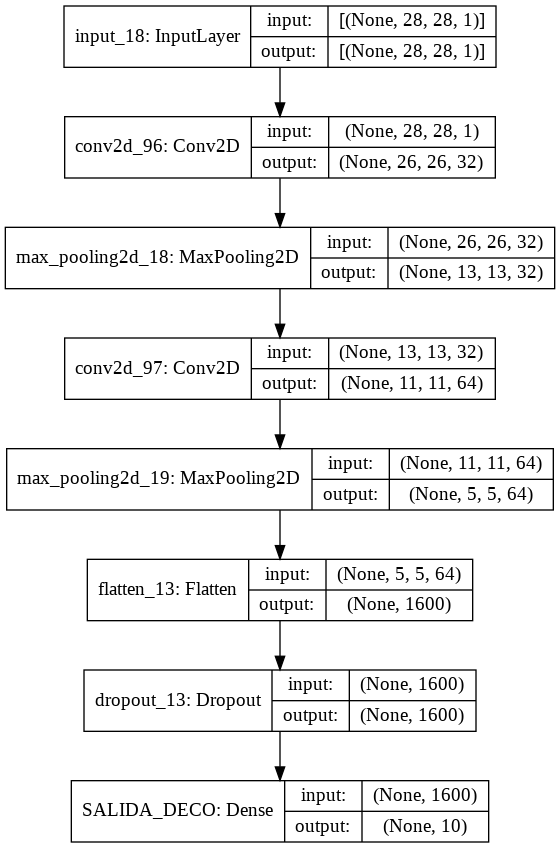

In [ ]:
dot_img_file = '/tmp/modelG_N.png'
tf.keras.utils.plot_model(modelG_N,to_file=dot_img_file, show_shapes=True)

In [ ]:
# Train model
if Train:
  batch_size = 128
  epochs = 30
  with tf.device(device_name):
    modelG_N.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
    modelG_N.fit(X_train2D, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.1)

Epoch 1/30
422/422 [==============================] - 2s 4ms/step - loss: 0.7776 - accuracy: 0.7659 - val_loss: 0.0818 - val_accuracy: 0.9780
Epoch 2/30
422/422 [==============================] - 1s 4ms/step - loss: 0.1197 - accuracy: 0.9632 - val_loss: 0.0574 - val_accuracy: 0.9848
Epoch 3/30
422/422 [==============================] - 1s 4ms/step - loss: 0.0889 - accuracy: 0.9734 - val_loss: 0.0477 - val_accuracy: 0.9873
Epoch 4/30
422/422 [==============================] - 2s 4ms/step - loss: 0.0713 - accuracy: 0.9777 - val_loss: 0.0398 - val_accuracy: 0.9900
Epoch 5/30
422/422 [==============================] - 1s 4ms/step - loss: 0.0649 - accuracy: 0.9796 - val_loss: 0.0378 - val_accuracy: 0.9890
Epoch 6/30
422/422 [==============================] - 1s 4ms/step - loss: 0.0575 - accuracy: 0.9819 - val_loss: 0.0351 - val_accuracy: 0.9898
Epoch 7/30
422/422 [==============================] - 2s 4ms/step - loss: 0.0498 - accuracy: 0.9830 - val_loss: 0.0336 - val_accuracy: 0.9903
Epoch 

In [ ]:
if Train:
  score = modelG_N.evaluate(X_test2D, y_test, verbose=0)
  print("Test loss:", score[0])
  print("Test accuracy:", score[1])

Test loss: 0.024375958368182182
Test accuracy: 0.9926000237464905


In [ ]:
if Train:
  score = modelG_N.evaluate(decoded1_imgs.reshape(10,28,28,1),labels_input_c, verbose=0)
  print("Test loss:", score[0])
  print("Test accuracy:", score[1])


Test loss: 0.0027047712355852127
Test accuracy: 1.0


In [14]:
if not Train:
  modelG_N.load_weights("/content/modelG_N.h5")

FULL PROCESS:

- I generate images with CGAN, pass them through the autoencoder and interpret them with the convolutional model:

Input Labels:  [0 0 0 0 0 0 0 0 0 0]
Predicted Labels: [0 0 0 0 0 0 0 0 0 0]
Input Labels:  [1 1 1 1 1 1 1 1 1 1]
Predicted Labels: [1 1 1 1 1 1 1 1 1 1]
Input Labels:  [2 2 2 2 2 2 2 2 2 2]
Predicted Labels: [2 2 3 2 2 2 2 2 2 8]
Input Labels:  [3 3 3 3 3 3 3 3 3 3]
Predicted Labels: [8 3 3 8 3 3 3 3 3 9]
Input Labels:  [4 4 4 4 4 4 4 4 4 4]
Predicted Labels: [4 4 9 4 4 4 4 5 4 4]
Input Labels:  [5 5 5 5 5 5 5 5 5 5]
Predicted Labels: [5 5 5 5 5 8 5 5 5 6]
Input Labels:  [6 6 6 6 6 6 6 6 6 6]
Predicted Labels: [6 6 6 6 6 6 6 6 6 6]
Input Labels:  [7 7 7 7 7 7 7 7 7 7]
Predicted Labels: [7 7 7 7 2 7 7 7 7 7]
Input Labels:  [8 8 8 8 8 8 8 8 8 8]
Predicted Labels: [8 8 8 2 5 8 8 8 8 8]
Input Labels:  [9 9 9 9 9 9 9 9 9 9]
Predicted Labels: [9 9 9 9 9 9 7 9 9 4]


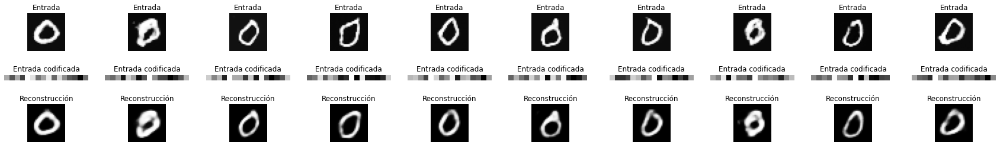

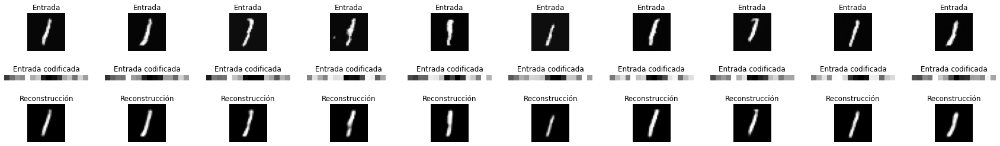

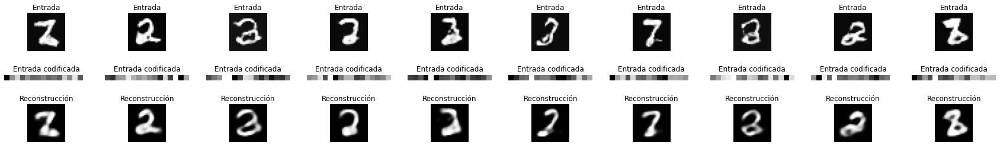

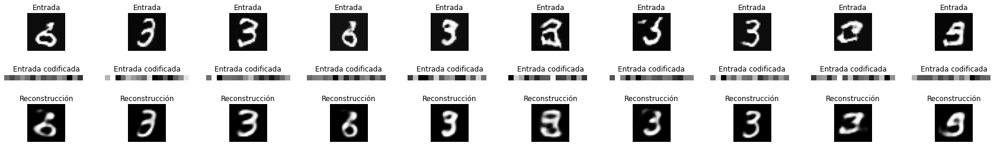

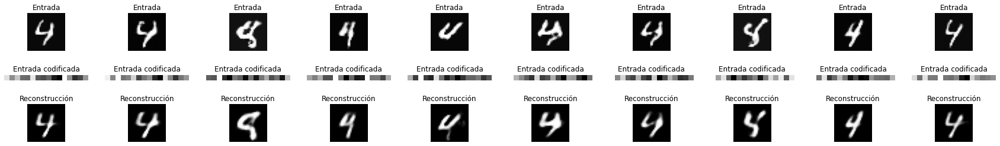

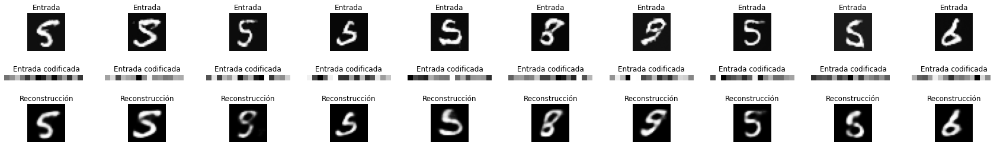

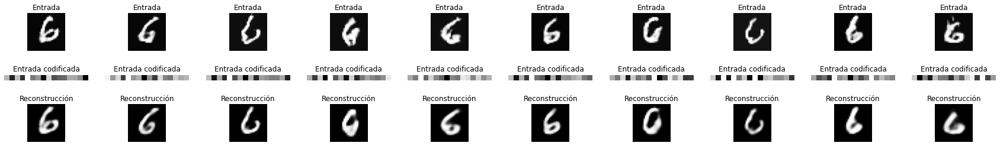

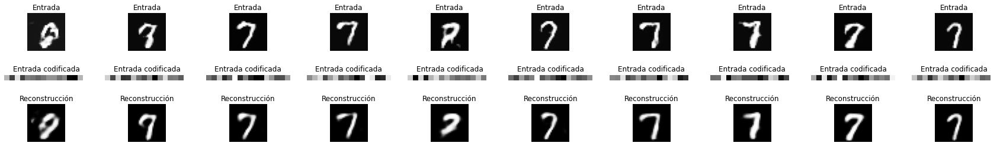

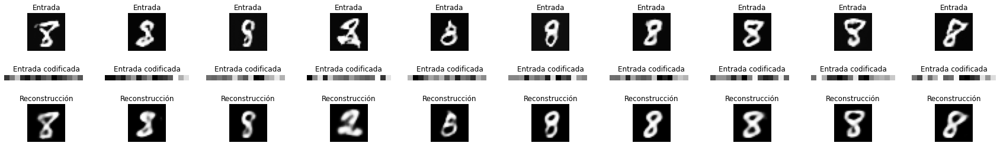

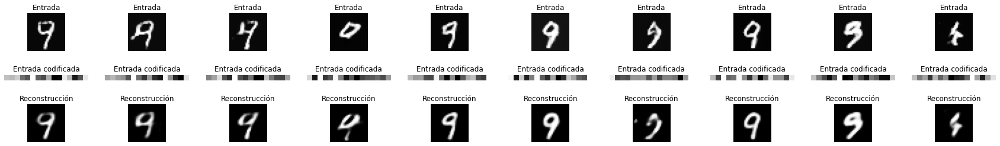

In [ ]:
latent_dim = 100
for num in range(10):
  z_input, labels_input = generate_numbers(latent_dim, 10, num)
  labels_input_c = keras.utils.to_categorical(labels_input, num_classes)
  print("Input Labels: ",labels_input)
  imgs=g_model.predict([z_input,labels_input])
  encoded1_imgs = encoder1.predict(imgs.reshape(-1,784))
  decoded1_imgs = decoder1.predict(encoded1_imgs)
  prob = modelG_N.predict(decoded1_imgs.reshape(10,28,28,1))
  print("Predicted Labels:",np.argmax(prob, axis=1))
  plot_data(imgs,encoded1_imgs,decoded1_imgs,encoding_dim=16)

# FUNCTIONS FOR CHAT TRANSMITTER

In [37]:
# returns the position in prob that has the lowest probability with success
def calculate_probs(prob, number):
  # I keep in aux only the probabilities that give the correct number
  aux = prob[np.argmax(prob,axis=1) == number]
  # I keep in post the prob index that correspond with the least probability
  pos=np.unique(prob == aux[np.argmin(aux[:,number])],return_index=True)
  #I search in pos for the prob index
  #Being True or False: we have a matrix with [True, False] [Position True, Position False]
  #is divided by 10 because it counts the 10 probabilities of each number
  pos1 = int(pos[1][1]/10)
  return pos1

# I generate image with conditional GAN
# number: number to generate 0 to 9
# num: number of numbers generated in each attempt
# Print True prints the images generated
# subpos: to order the suplots
# It must also be fulfilled that the least probability is the generated number (number)
def generate_img_number(number,num,Print,subpos=0,encoder=encoder1,decoder=decoder1):
  pr = 100
  z_input, labels_input = generate_numbers(latent_dim, num, number)
  labels_input_c = keras.utils.to_categorical(labels_input, num_classes)
  imgs=g_model.predict([z_input, labels_input])
  encoded1_imgs = encoder.predict(imgs.reshape(num,784))
  decoded1_imgs = decoder.predict(encoded1_imgs)
  prob = modelG_N.predict(decoded1_imgs.reshape(num,28,28,1))
  pos = calculate_probs(prob, number)
  pr = prob[pos,number] * 100
 
  if Print:
    plt.subplot(3,3,1+subpos)
    plt.imshow(imgs[pos].reshape(28,28), cmap='gray')
    plt.subplot(3,3,4+subpos)
    plt.imshow(encoded1_imgs[pos].reshape(1,16), cmap='gray')
    plt.subplot(3,3,7+subpos)
    plt.imshow(decoded1_imgs[pos].reshape(28,28), cmap='gray')
  return encoded1_imgs[pos]

#I transform the numerical ascii to latent space with encoder1
def trans_char(ascii,num,Print,encoder=encoder1,decoder=decoder1):
  if ascii < 100:
    img_number_cod_0 = generate_img_number(0,num,Print)
  else:
    img_number_cod_0 = generate_img_number(int(ascii/100),num,Print)
  a = ascii / 10
  img_number_cod_1 = generate_img_number(int(a % 10),num,Print,subpos=1)
  img_number_cod_2 = generate_img_number(ascii % 10,num,Print,subpos=2)
  img_number_cod = np.array([img_number_cod_0,img_number_cod_1,img_number_cod_2])
  img_number_cod = img_number_cod.reshape(3,16)
  return img_number_cod

# See in time optimization of the value of num = 10
def trans_frase(frase,encoder=encoder1,decoder=decoder1,num=10,Print=False):
  ascii = ord(frase[0])
  if Print:
    print(frase[0],": ",ascii)
  frase_cod = trans_char(ascii,num=num,Print=Print)
  frase = frase[1:]
  for a in frase:
    ascii = ord(a)
    letra_cod = trans_char(ascii,num=num,Print=Print)
    frase_cod = np.concatenate((frase_cod,letra_cod))
    if Print:
      print(a,": ",ascii)
  return frase_cod

a :  97


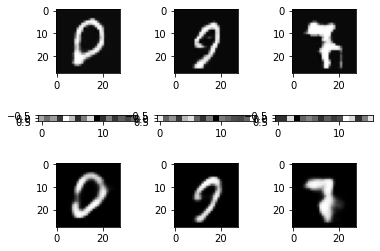

In [39]:
a = trans_frase("a",Print=True)

array([23.895658 , 21.052443 , 24.400576 , 14.08123  , 28.936014 ,
       23.782385 , 19.473715 , 23.826376 , 26.841341 , 13.6354885,
       16.464413 , 31.319616 , 17.955273 , 15.270482 , 11.488907 ,
       21.1196   ], dtype=float32)

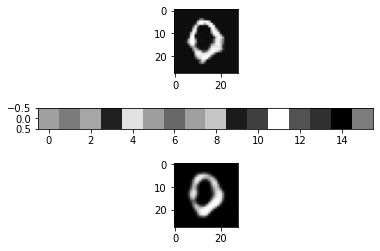

In [ ]:
generate_img_number(0,10,Print=True)

array([20.814621 , 10.621279 , 30.339363 ,  9.289791 , 10.293516 ,
       26.864359 , 11.555653 , 13.909648 , 14.894185 , 14.825855 ,
        5.7868004, 11.866894 , 14.105533 , 14.259843 , 19.655355 ,
       19.07334  ], dtype=float32)

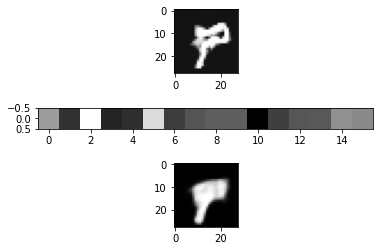

In [ ]:
generate_img_number(9,10,Print=True)

array([21.022934, 22.013445, 34.340252, 11.528305, 11.345249, 21.797844,
       18.085575, 21.501032,  6.521517,  9.756098, 11.20146 , 25.709394,
       20.870499, 15.191556, 19.436384, 29.290108], dtype=float32)

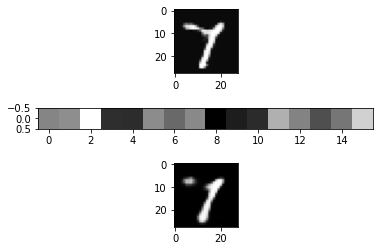

In [ ]:
generate_img_number(7,10,Print=True)

## Time Optimization

- I tune the number of images generated in each attempt from 5 to 1000 to see the best configuration to encrypt in the shortest time possible.

In [ ]:
if Train:
  valores = np.arange(5,1000,10)
  tiempo = []
  for a in tqdm(valores):
    start_time = time()
    b = trans_frase("hola",num=a,Print=False)
    tiempo.append(time()-start_time)

100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


Text(0, 0.5, 'Tiempo de Ejecución (Seg)')

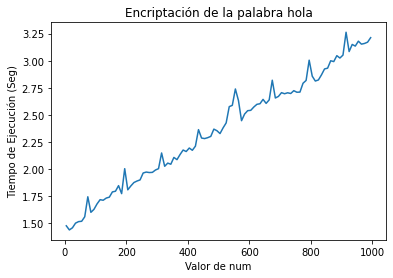

In [ ]:
if Train:
  plt.plot(valores, tiempo)
  plt.title('Encriptación de la palabra hola')
  plt.xlabel('Valor de num')
  plt.ylabel('Tiempo de Ejecución (Seg)')

In [ ]:
if Train:
  np.argmin(tiempo) * 10

10

- I set a value of 10 as optimal

# FUNCTION FOR CHAT RECEIVER

In [ ]:
def receive_char(img_number_cod,decoder=decoder1):
  img_number_decod= decoder.predict(img_number_cod)
  prob = modelG_N.predict(img_number_decod.reshape(3,28,28,1))
  ascii = np.argmax(prob, axis=1)
  return chr((ascii[0]*100)+(ascii[1]*10)+ascii[2])

def receive_frase(frase_cod,decoder=decoder1):
  if (len(frase_cod)) % 3 != 0:
    print("EL ARRAY TIENE QUE SER MULTIPLO DE 3")
  else:
    img_number_decod = decoder.predict(frase_cod)
    prob = modelG_N.predict(img_number_decod.reshape(len(frase_cod),28,28,1))
    ascii = np.argmax(prob, axis=1)
    frase_decod = chr((ascii[0]*100)+(ascii[1]*10)+ascii[2])
    for a in np.arange(3,len(frase_cod),3):
      letra_decod = chr((ascii[a]*100)+(ascii[a+1]*10)+ascii[a+2])
      frase_decod = frase_decod + letra_decod
  return frase_decod

# TRY FULL CHAT





In [ ]:
texto = "abcdefghijklmnopqrstuvwxyz"
texto_cod = trans_frase(texto)
texto_decod = receive_frase(texto_cod)
texto_decod

'abcdefghijklmnopqrstuvwxyz'

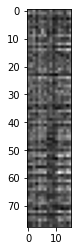

In [ ]:
texto_cod.shape
plt.imshow(texto_cod, cmap='gray')

# ENCRYPTION CHECK

## Dataset generation

- An artificial dataset is generated with the numbers 0 to 9 encoded, 1000 of each type. In total 10000 elements, to train a supposed model trying to crack the code.

In [ ]:
if Train: 
  with tf.device(device_name):
    X_hack = []
    y_hack = []
    a = 1000

    for num in tqdm(range(10)):
      if num == 0:
        y_hack = np.full_like(np.arange(a, dtype=int),0)
        X_hack = generate_img_number(0,10,Print=False,)
      else:
        y_hack = np.concatenate((y_hack,np.full_like(np.arange(a, dtype=int),num)))
      for iter in range(a):
        X_hack = np.concatenate((X_hack,generate_img_number(num,10,Print=False)))
    X_hack = X_hack.reshape(-1,16)
    X_hack = X_hack[1:,]

  print(X_hack.shape)
  print(y_hack.shape)



  0%|          | 0/10 [00:00<?, ?it/s]

 10%|█         | 1/10 [02:06<18:58, 126.54s/it]

 20%|██        | 2/10 [04:14<16:55, 126.92s/it]

 30%|███       | 3/10 [06:22<14:50, 127.17s/it]

 40%|████      | 4/10 [08:30<12:44, 127.43s/it]

 50%|█████     | 5/10 [10:37<10:37, 127.55s/it]

 60%|██████    | 6/10 [12:46<08:31, 127.84s/it]

 70%|███████   | 7/10 [14:56<06:25, 128.36s/it]

 80%|████████  | 8/10 [17:03<04:16, 128.01s/it]

 90%|█████████ | 9/10 [19:10<02:07, 127.81s/it]

100%|██████████| 10/10 [21:18<00:00, 127.84s/it]

(10000, 16)
(10000,)


In [ ]:
if Train:
  X_hack_dataframe = pd.DataFrame(X_hack)
  y_hack_dataframe = pd.DataFrame(y_hack)
  dataframe = X_hack_dataframe.copy()
  dataframe['Y'] = y_hack_dataframe

In [ ]:
if Train:
  X_hack_dataframe.to_excel("X_dataframe.xlsx")
  y_hack_dataframe.to_excel("y_dataframe.xlsx")
  dataframe.to_excel("dataframe.xlsx")

- If we don't want to generate dataframe:

In [23]:
if not Train:
  X_hack_dataframe = pd.read_excel('/content/X_dataframe.xlsx')
  y_hack_dataframe = pd.read_excel('/content/y_dataframe.xlsx')
  dataframe = pd.read_excel('/content/dataframe.xlsx')

In [ ]:
if not Train:
  X_hack_dataframe.drop("Unnamed: 0",axis=1, inplace=True)
  X_hack_dataframe
  X_hack = np.array(X_hack_dataframe)

In [ ]:
if not Train:
  y_hack_dataframe.drop("Unnamed: 0",axis=1, inplace=True)
  y_hack_dataframe
  y_hack = np.array(y_hack_dataframe)

In [ ]:
if not Train:
  dataframe.drop("Unnamed: 0",axis=1, inplace=True)
  dataframe
# = np.array(y_hack_dataframe)

### Statistic analysis

In [ ]:
X_hack_dataframe.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,21.645876,19.270721,24.479271,15.253358,23.597222,22.885320,19.489155,15.851300,21.798808,13.286077,17.494353,22.421341,18.956603,20.645993,19.530786,27.026033
std,7.685390,7.163843,7.715091,5.467286,8.269324,7.505183,7.909445,5.132851,7.052066,4.725006,6.789624,8.991125,7.331168,5.999229,8.456227,8.515733
min,0.107015,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.208073,0.129462,0.000000,0.000000,0.000000,4.069400,0.000000,3.025174
25%,16.243160,14.235682,19.326684,11.254992,17.979253,17.840811,13.885094,12.293272,16.758761,9.816619,12.639705,16.001018,13.732881,16.341818,13.937362,20.959633
50%,21.481856,19.151319,24.734686,15.102085,23.717146,22.715849,18.925671,15.891075,21.561096,13.434500,17.560178,21.761012,18.387394,20.289505,18.931480,26.640960
75%,26.795231,24.198553,29.836597,19.024324,29.246960,27.685879,24.536583,19.413837,26.589874,16.777710,22.361176,27.833186,23.647966,24.451933,24.044902,32.594871
max,48.814137,43.333317,48.924778,39.937695,51.567490,50.919262,54.635883,33.765572,45.989731,27.555752,37.576599,65.755783,56.530346,42.982559,56.961571,59.340771


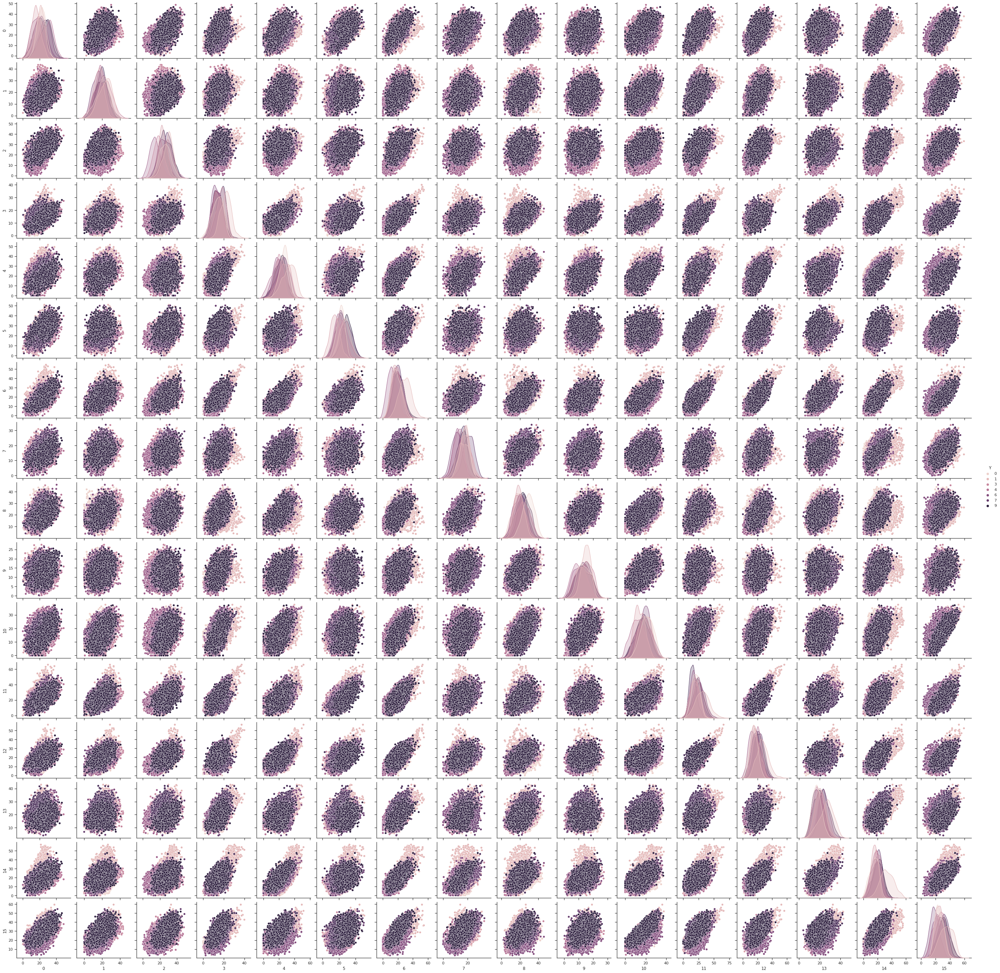

In [ ]:
# SEE SCATTER MATRIX

#warnings.filterwarnings("ignore")

sns.set_theme(style="ticks")
scatter = sns.pairplot(dataframe, hue="Y")

## Hack model test

- A model equal in structure to the decoder and the convolutional model is generated

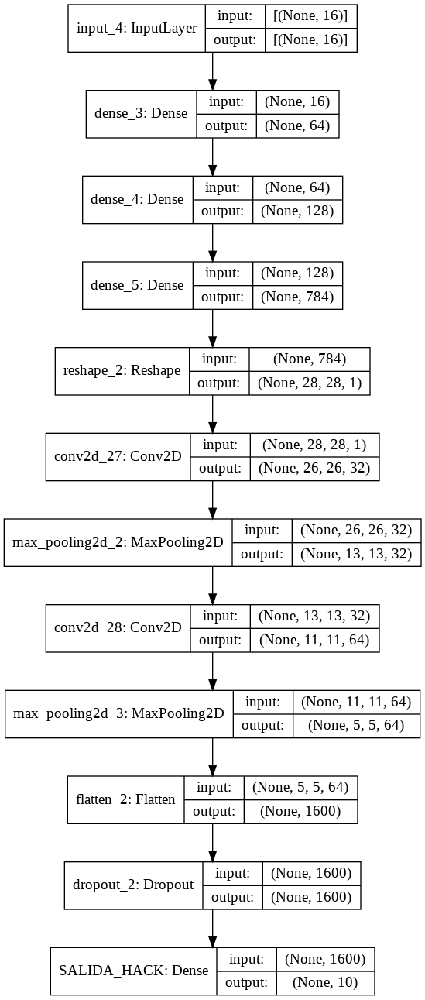

In [43]:
def Conv_Hack():
  input_shape = (16,)
  model = keras.Sequential(
    [
        Input(shape=input_shape),
        Dense(64, activation='relu'),
        Dense(128, activation='relu'),
        Dense(784, activation='relu'),
        Reshape((28,28,1),input_shape = (784,1)),
        Conv2D(32, kernel_size=(3,3), activation="relu"),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(64, kernel_size=(3,3), activation="relu"),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dropout(0.5),
        Dense(num_classes, activation="softmax",name='SALIDA_HACK'),
    ],name = 'MODEL_HACK'
  )
  return model

model_Hack = Conv_Hack()
dot_img_file = '/tmp/model_Hack.png'
tf.keras.utils.plot_model(model_Hack,to_file=dot_img_file, show_shapes=True)

In [44]:
model_Hack.summary()

Model: "MODEL_HACK"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 64)                1088      
_________________________________________________________________
dense_4 (Dense)              (None, 128)               8320      
_________________________________________________________________
dense_5 (Dense)              (None, 784)               101136    
_________________________________________________________________
reshape_2 (Reshape)          (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 11, 11, 64)        1

In [ ]:
y_hack_c = keras.utils.to_categorical(y_hack, num_classes)

In [ ]:
if Train:
  batch_size = 128
  epochs = 100

  with tf.device(device_name):
    model_Hack.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
    model_Hack.fit(X_hack, y_hack_c, batch_size=batch_size, epochs=epochs)

Epoch 1/100
8/8 [==============================] - 1s 8ms/step - loss: 2.4857 - accuracy: 0.1193
Epoch 2/100
8/8 [==============================] - 0s 4ms/step - loss: 2.1333 - accuracy: 0.2921
Epoch 3/100
8/8 [==============================] - 0s 4ms/step - loss: 1.8495 - accuracy: 0.4553
Epoch 4/100
8/8 [==============================] - 0s 3ms/step - loss: 1.4706 - accuracy: 0.5427
Epoch 5/100
8/8 [==============================] - 0s 4ms/step - loss: 1.1828 - accuracy: 0.5761
Epoch 6/100
8/8 [==============================] - 0s 4ms/step - loss: 0.9666 - accuracy: 0.6506
Epoch 7/100
8/8 [==============================] - 0s 4ms/step - loss: 0.7789 - accuracy: 0.7097
Epoch 8/100
8/8 [==============================] - 0s 4ms/step - loss: 0.7048 - accuracy: 0.7359
Epoch 9/100
8/8 [==============================] - 0s 4ms/step - loss: 0.6410 - accuracy: 0.7543
Epoch 10/100
8/8 [==============================] - 0s 3ms/step - loss: 0.5833 - accuracy: 0.7940
Epoch 11/100
8/8 [===========

- If we don't want to train the model

In [25]:
if not Train:
  model_Hack.load_weights('/content/model_Hack.h5')

In [26]:
def hack_frase(frase_cod):
  if (len(frase_cod)) % 3 != 0:
    print("EL ARRAY TIENE QUE SER MULTIPLO DE 3")
  else:
    prob = model_Hack.predict(frase_cod.reshape(len(frase_cod),16))
    ascii = np.argmax(prob, axis=1)
    frase_decod = chr((ascii[0]*100)+(ascii[1]*10)+ascii[2])
    for a in np.arange(3,len(frase_cod),3):
      letra_decod = chr((ascii[a]*100)+(ascii[a+1]*10)+ascii[a+2])
      frase_decod = frase_decod + letra_decod
  return frase_decod

In [ ]:
texto = "Hola me llamo Felipe."
texto_cod = trans_frase(texto,encoder1,decoder1)


In [ ]:
texto_decod = hack_frase(texto_cod)
texto_decod

'Hogc me&llMmΏRFelipe.'

- I generate 1000 random texts composed of two characters and check the accuracy of the model

In [ ]:
def accuracy_Hack():
  OK = 0
  porcentaje = []
  for a in range(1000):
    char = "abcdefghijklmnñopqrstuvwyz ABCDEFGHIJKLMNÑOPQRSTUVWXYZ ,.-;:_?¿!$%&/="
    frase = random.choice(char) + random.choice(char)
    texto_cod = trans_frase(frase,encoder1,decoder1)
    texto_decod = hack_frase(texto_cod)
    if frase == texto_decod:
      OK += 1
    if a % 10 == 0:
      porcentaje.append((OK/(a+1))*100)
    if a % 100 == 0:
      print("Porcentaje de Acierto: ",(OK/(a+1))*100)

  plt.title('Porcentaje Acierto modelo HACK')
  plt.ylabel('%')
  plt.xlabel('Intentos x10')
  plt.plot(porcentaje)


Porcentaje de Acierto:  0.0
Porcentaje de Acierto:  65.34653465346535
Porcentaje de Acierto:  55.72139303482587
Porcentaje de Acierto:  57.475083056478404
Porcentaje de Acierto:  58.85286783042394
Porcentaje de Acierto:  58.48303393213573
Porcentaje de Acierto:  58.56905158069884
Porcentaje de Acierto:  58.63052781740371
Porcentaje de Acierto:  58.92634207240949
Porcentaje de Acierto:  59.04550499445062


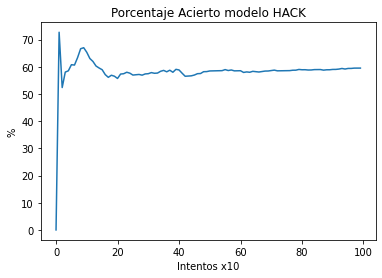

In [ ]:
accuracy_Hack()

- Saving Models

In [ ]:
g_model.save('/tmp/cgan_generator.h5')
d_model.save('/tmp/cgan_discriminator.h5')
gan_model.save('/tmp/cgan.h5')
modelG_N.save('/tmp/modelG_N.h5')
encoder1.save('/tmp/encoder1.h5')
encoder2.save('/tmp/encoder2.h5')
decoder1.save('/tmp/decoder1.h5')
decoder2.save('/tmp/decoder2.h5')

# JOINT TRAINING

In [45]:
# Separate GAN generator in inputs and output and adjust dimensions
gen_noise, gen_label = g_model.input
gen_output = g_model.output
gen_output_re = Reshape((784,))(gen_output)
# I connect the encoder1 to the output of the GAN generator
encoder_output = encoder1(gen_output_re)
# There are two paths, one for the hacker model and the other for the decoder
# Connection with model hacker
hack_output = model_Hack(encoder_output)
# Connection with decoder and convolutional model
decoder_output = decoder1(encoder_output)
decoder_output_re = Reshape((28,28,1))(decoder_output)
con_output = modelG_N(decoder_output_re)
# I generate the models
model_encrypt_hack = Model([gen_noise,gen_label], hack_output)
model_encrypt_de = Model([gen_noise,gen_label], con_output)
model_total = Model([gen_noise,gen_label], [hack_output,con_output])

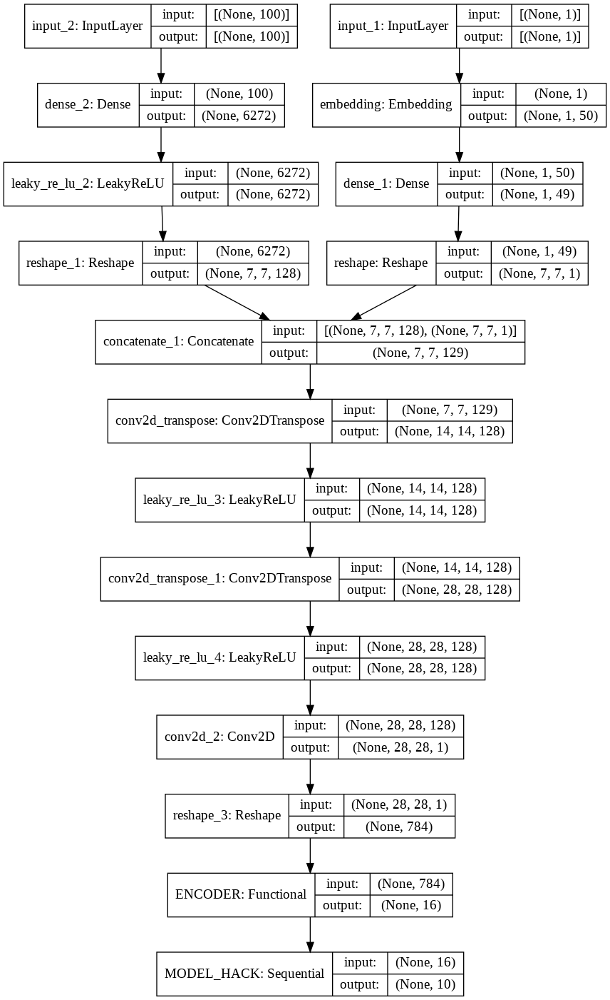

In [ ]:
dot_img_file = '/tmp/model_1.png'
tf.keras.utils.plot_model(model_encrypt_hack,to_file=dot_img_file, show_shapes=True)

In [47]:
model_encrypt_hack.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
input_1 (InputLayer)            [(None, 1)]          0                                            
__________________________________________________________________________________________________
dense_2 (Dense)                 (None, 6272)         633472      input_2[0][0]                    
__________________________________________________________________________________________________
embedding (Embedding)           (None, 1, 50)        500         input_1[0][0]                    
____________________________________________________________________________________________

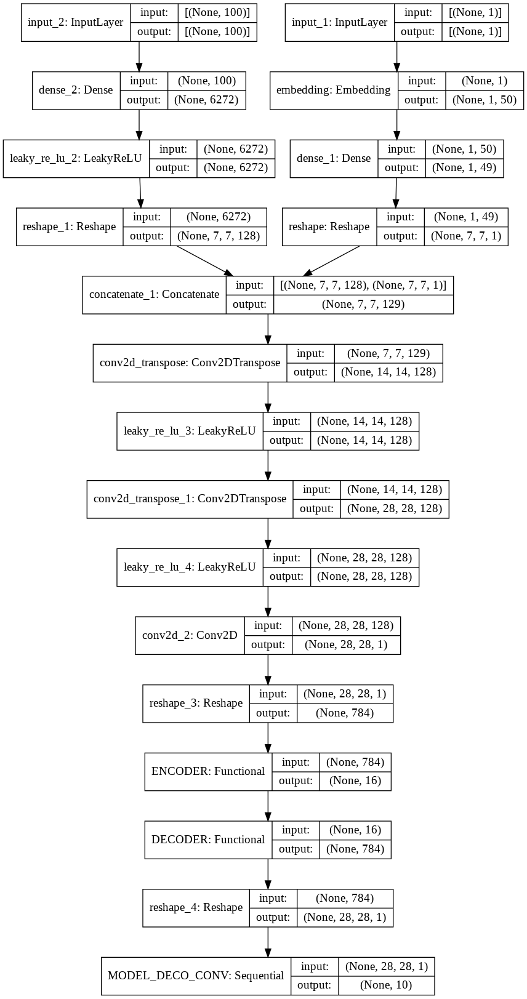

In [ ]:
dot_img_file = '/tmp/model_1.png'
tf.keras.utils.plot_model(model_encrypt_de,to_file=dot_img_file, show_shapes=True)

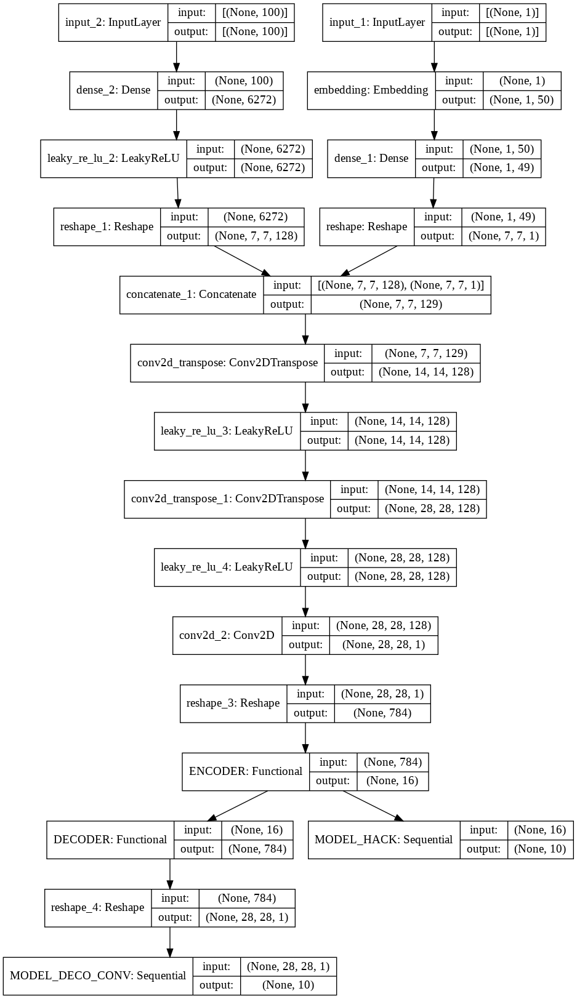

In [ ]:
dot_img_file = '/tmp/model_1.png'
tf.keras.utils.plot_model(model_total,to_file=dot_img_file, show_shapes=True)

In [46]:
model_total.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
input_1 (InputLayer)            [(None, 1)]          0                                            
__________________________________________________________________________________________________
dense_2 (Dense)                 (None, 6272)         633472      input_2[0][0]                    
__________________________________________________________________________________________________
embedding (Embedding)           (None, 1, 50)        500         input_1[0][0]                    
____________________________________________________________________________________________

In [ ]:
def init_weights_OK():
  model_Hack.load_weights('/content/model_Hack.h5')
  encoder1.load_weights('/content/encoder1.h5')
  decoder1.load_weights('/content/decoder1.h5')
  g_model.load_weights('/content/cgan_generator.h5')
  modelG_N.load_weights('/content/modelG_N.h5')

In [ ]:
def init_weights_0():
  autoencoder1, encoder1, decoder1, input_img1 = AutoEncript(16)
  autoencoder2, encoder2, decoder2, input_img2 = AutoEncript(16)
  #g_model = define_generator(100)
  modelG_N = Conv_DE()
  model_Hack = Conv_Hack()


In [ ]:
# maximize the loss of hack model creating a custom loss function
def loss_hack(y_true, y_pred):
    cce = tf.keras.losses.CategoricalCrossentropy()
    return -cce(y_true, y_pred)

In [ ]:
def train_final(epoch=6000,batch=20,lossweighD=0.8,lossweighH=1.0,Print=True,TrainGAN=False):
  latent_dim = 100
  opt = Adam(lr=0.0002, beta_1=0.5)
  losses = {
	  "MODEL_DECO_CONV": "categorical_crossentropy",
	  "MODEL_HACK": loss_hack,
  }
  lossWeights = {"MODEL_DECO_CONV": lossweighD, "MODEL_HACK": lossweighH}

  model_total.compile(loss=losses,loss_weights=lossWeights, optimizer=opt,metrics='accuracy')
  model_encrypt_hack.compile(loss="categorical_crossentropy",optimizer=opt,metrics='accuracy')

  loss=[]
  acc=[]
  
  for a in range(epoch):
    # generate inputs for GAN generator
    z_input, labels_input = generate_latent_points(latent_dim, batch)
    labels_input_c = keras.utils.to_categorical(labels_input, num_classes)

    # config weigths for first train
    # GAN generator weights have a hiperparameter for configure
    model_Hack.trainable = False
    if TrainGAN:
      g_model.trainable = True
    else:
      g_model.trainable = False
    autoencoder1.trainable = True
    modelG_N.trainable = True
    # train total_model for maximize hacker model loss (100%) and minimize decoder model loss (80%)
    loss1 = model_total.train_on_batch([z_input, labels_input],[labels_input_c,labels_input_c],return_dict=True)
    # store loss and accuracy
    loss.append([loss1['MODEL_DECO_CONV_loss'],loss1['MODEL_HACK_loss']])
    acc.append([loss1['MODEL_DECO_CONV_accuracy'],loss1['MODEL_HACK_accuracy']])

    # config weigths for second train
    model_Hack.trainable = True
    autoencoder1.trainable = False
    g_model.trainable = False
    modelG_N.trainable = False
    # train model hack for minimize loss
    loss2 = model_encrypt_hack.train_on_batch([z_input, labels_input],labels_input_c,return_dict=True)
    
  if Print:
    plt.figure(figsize=(40,8))
    plt.subplot(1,2,1)
    plt.title('LOSS')
    plt.plot(loss)
    plt.legend(['DECO','HACK'])
    
    plt.figure(figsize=(40,8))
    plt.subplot(1,2,2)
    plt.title('ACCURACY')
    plt.plot(acc)
    plt.legend(['DECO','HACK'])
  
  return np.mean(loss[-10:],axis=0),np.mean(acc[-10:],axis=0)




I try to adjust the weight of the loss of the convolutional network, with the models already trained

In [ ]:
res = []
acc = []
weight = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

for a in weight:
  init_weights_OK()
  print("LOSS WEIGHT: ",a)
  acc = train_final(epoch=7000,lossweighD=a,Print=False)
  print(acc)
  res.append(acc)



LOSS WEIGHT:  0.1
(array([ 0.60012728, -2.30089343]), array([0.83999999, 0.125     ]))
LOSS WEIGHT:  0.2
(array([ 0.55284691, -2.30440414]), array([0.84999999, 0.09      ]))
LOSS WEIGHT:  0.3
(array([ 0.65405493, -2.28526852]), array([0.82, 0.18]))
LOSS WEIGHT:  0.4
(array([ 0.58334597, -2.29672084]), array([0.83000001, 0.115     ]))
LOSS WEIGHT:  0.5
(array([ 0.55404664, -2.30448005]), array([0.84000001, 0.09      ]))
LOSS WEIGHT:  0.6
(array([ 0.66439517, -2.3003191 ]), array([0.85000001, 0.105     ]))
LOSS WEIGHT:  0.7
(array([ 0.74395254, -2.30144186]), array([0.83, 0.11]))
LOSS WEIGHT:  0.8
(array([ 0.75172764, -2.27533951]), array([0.82 , 0.205]))
LOSS WEIGHT:  0.9
(array([ 0.64518645, -2.30401454]), array([0.86, 0.1 ]))


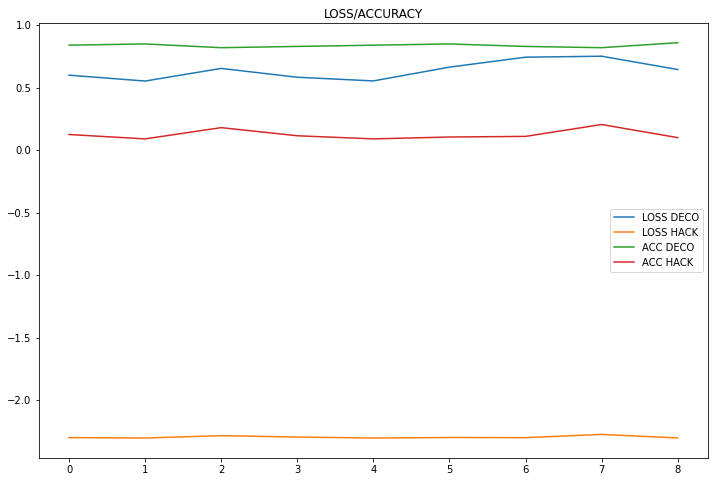

In [ ]:
plt.figure(figsize=(12,8))
plt.title('LOSS/ACCURACY')
plt.plot(np.array(res).reshape(9,4))
plt.legend(['LOSS DECO','LOSS HACK','ACC DECO','ACC HACK'])

(array([ 0.58267378, -2.30209675]), array([0.82, 0.16]))

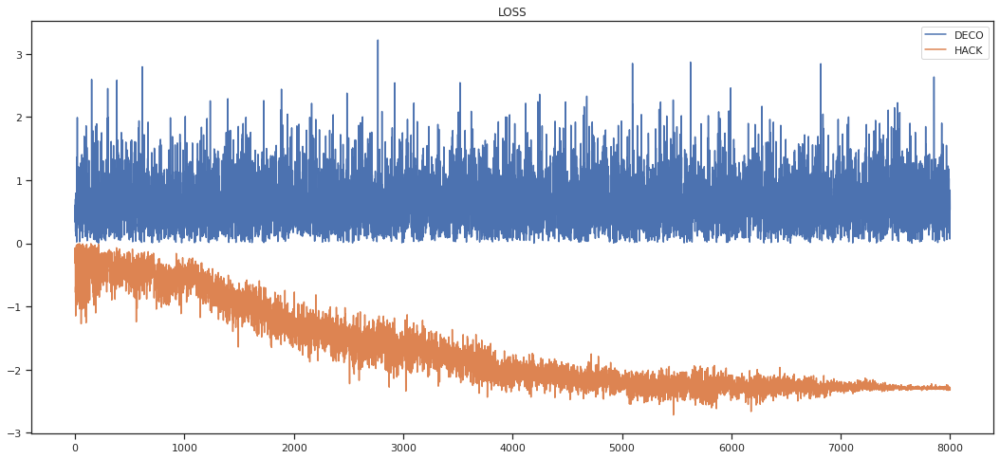

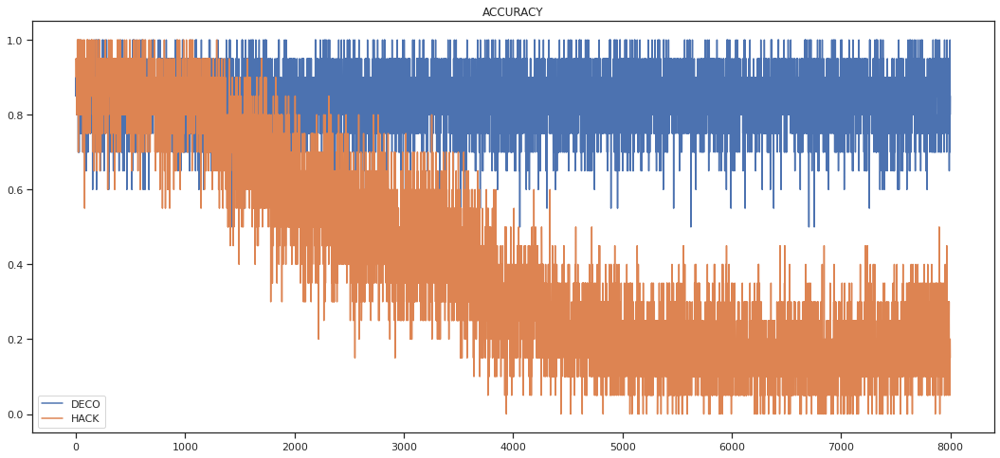

In [ ]:
if Train:
  init_weights_OK()
  train_final(epoch=8000,lossweighD=0.8)

Porcentaje de Acierto:  0.0
Porcentaje de Acierto:  0.0
Porcentaje de Acierto:  0.0
Porcentaje de Acierto:  0.0
Porcentaje de Acierto:  0.0
Porcentaje de Acierto:  0.0
Porcentaje de Acierto:  0.0
Porcentaje de Acierto:  0.0
Porcentaje de Acierto:  0.0
Porcentaje de Acierto:  0.0


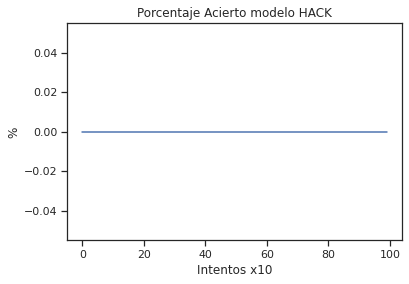

In [ ]:
accuracy_Hack()

- Train GAN

(array([ 0.59128329, -2.30401721]), array([0.83666667, 0.08166667]))

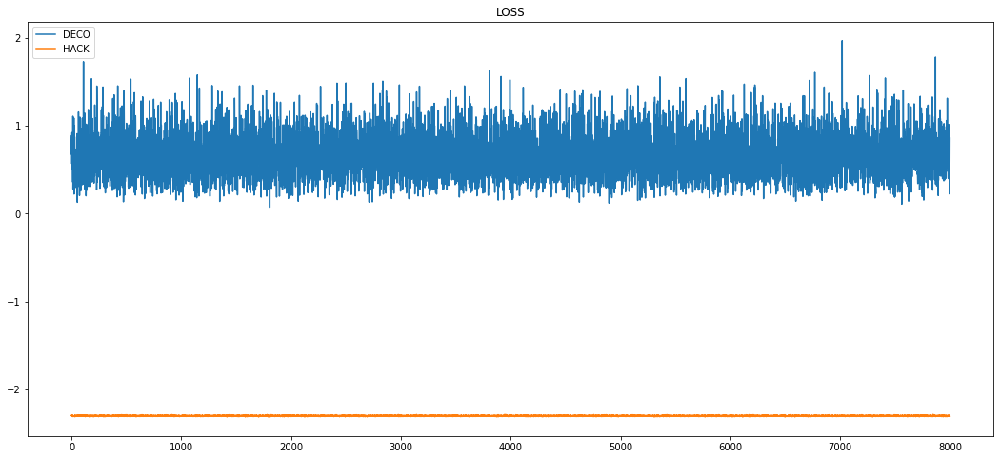

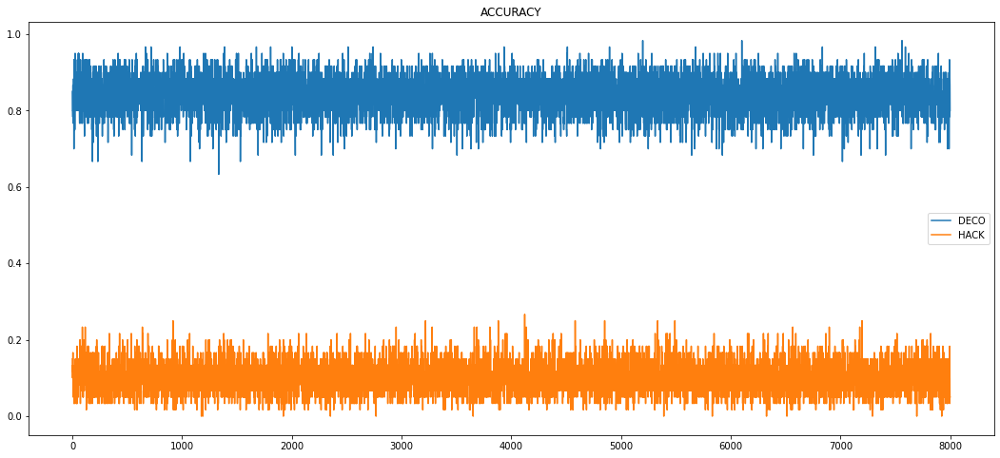

In [ ]:
init_weights_0()
train_final(epoch=8000,batch=60,lossweighD=0.6,TrainGAN=True)

(array([ 4.62889424e-06, -2.27085762e+00]), array([1.   , 0.075]))

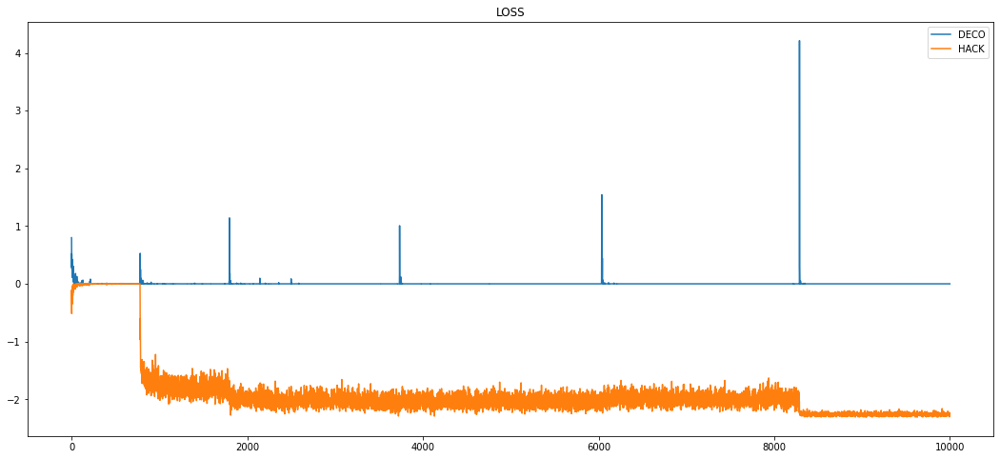

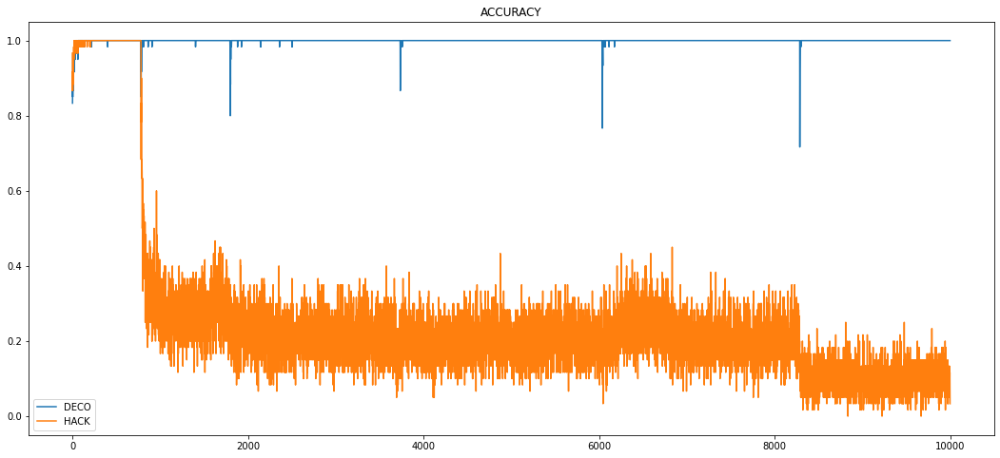

In [ ]:
init_weights_OK()
train_final(epoch=10000,batch=60,lossweighD=0.6,TrainGAN=True)